# **Marketing Campaign Analysis**

# **Executive Summary**

This project proposes using the Hierarchical Clustering method to segment this company's customer data for marketing purposes. Performing extensive Exploratory Data Analysis and Data pre-processing reveals that variables about customers' past purchasing behavior should be the only ones used for segmentation. Accordingly, performing the Hierarchical clustering method on this company's customer behavioral data yields three clusters containing customers with low, medium, and high numbers of households respectively. However, when plotted against other customer profile variables, the clusters overlap suggesting further data preprocessing could give better results. I recommend that stakeholders utilize this method and tailor their marketing campaigns for each cluster to increase their return on investment.

# **Problem and Solution Summary**

The main problem to solve, as stated in the problem definition section below, is the problem of finding the optimal way to segment customer data to increase this company’s return on investment. In this notebook, you will find that I go through multiple clustering methods and discuss the results from each. In the end, I have found that the Hierarchical Clustering method solves the problem best because it is the only method that gives clusters that are segmented without overlap when plotted against at least one customer profile variable.


## **Problem Definition**

### **The Context:**

 - In a highly competitive market where companies are having to continuously improve their strategies to grow and retain their customers, optimizing customer segmentation has a scientifically proven positive effect on ROI as it allows companies to better understand their customer base and create personalized marketing campaigns.

### **The objective:**

 - The main goal for this problem statement is to find the best way to segment the customers given their profile and behavior pertaining their purchase history and engagement with various marketing campaigns.

### **The key questions:**

- Some of the key questions that need to be answered are:
  - What does the company's current customer base look like?
  - Based on the features given, what is the best way to segment this data?
  - What method should be used to do this?
  - What are the pros and cons of using such method?
  - Is there room for improvment?

### **The problem formulation**:

- To answer the key questions stated above, I will using methods of Unsupervised Learning and Clustering. After first getting a good understanding of the data through EDA (Exploratory Data Analysis), I will utilize methods such as K-Means, PCA and tSNE to test and see what the best way to segment the data and what the best performing model of segmentation is.

------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [ ]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.0 MB/s eta 0:00:00


In [ ]:
# Importing libraries for data manipulation
import numpy as np

import pandas as pd

# Importing libraries for data visualization
import seaborn as sns

import matplotlib.pyplot as plt

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# Importing clustering algorithms
from sklearn.cluster import KMeans

from sklearn.mixture import GaussianMixture

from sklearn_extra.cluster import KMedoids

from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import DBSCAN

# Silhouette score
from sklearn.metrics import silhouette_score

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Importing PCA and t-SNE
from sklearn.decomposition import PCA

from sklearn.manifold import TSNE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Loading the data
data = pd.read_csv('/content/drive/MyDrive/Applied Data Science/Final Project/marketing_campaign.csv')

## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for missing values
- Checking for duplicated values
- Drop the column which has no null values

In [ ]:
# Reading the dataset
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0


In [ ]:
# Checking the data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
# Checking for duplicated values
data[data.duplicated()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response


In [ ]:
# Checking for missing values
data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64

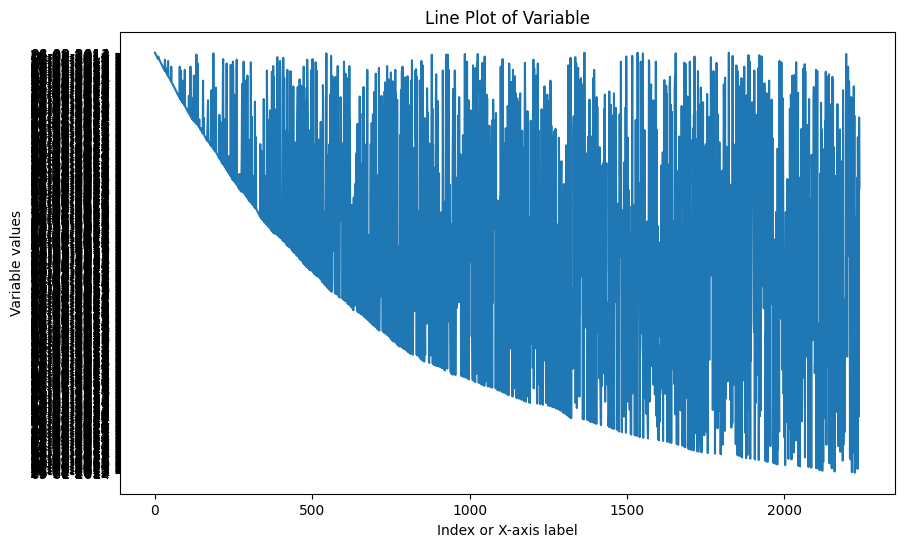

In [ ]:
#Visualize Dt_Customer
plt.figure(figsize=(10, 6))
sns.lineplot(data=data, x=data.index, y='Dt_Customer')
plt.title('Line Plot of Variable')
plt.xlabel('Index or X-axis label')
plt.ylabel('Variable values')
plt.show()

In [ ]:
# drop ID and Dt_Customer
data.drop(['Dt_Customer','ID'], axis=1, inplace=True)

In [ ]:
# Check that columns have been dropped
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Recency              2240 non-null   int64  
 7   MntWines             2240 non-null   int64  
 8   MntFruits            2240 non-null   int64  
 9   MntMeatProducts      2240 non-null   int64  
 10  MntFishProducts      2240 non-null   int64  
 11  MntSweetProducts     2240 non-null   int64  
 12  MntGoldProds         2240 non-null   int64  
 13  NumDealsPurchases    2240 non-null   int64  
 14  NumWebPurchases      2240 non-null   int64  
 15  NumCatalogPurchases  2240 non-null   i

#### **Observations and Insights from the Data overview:**

- There are 27 columns and 2240 observations in the dataset.
- The data type for Education, Marital_Status and Dt_Customer is object while all other columns contain numbers.
- There are no duplicated values
- Income is the only incomplete column with 24 missing values. These will be imputed later in the analysis.

## **Exploratory Data Analysis (EDA)**


- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?
4. There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

In [ ]:
# Separate numeric and string variables
num_col = data.select_dtypes(include=['number']).columns
strng_col = data.select_dtypes(include=['object', 'category']).columns

print("Numeric Columns:")
print(num_col)

print("\String Columns:")
print(strng_col)

Numeric Columns:
Index(['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response'],
      dtype='object')
\String Columns:
Index(['Education', 'Marital_Status'], dtype='object')


In [ ]:
# Summary Statistics
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0


In [ ]:
# number of unique observations in each category of categorical columns
for column in strng_col:
    unique_counts = data[column].value_counts()
    print(f"Unique observations in '{column}':\n{unique_counts}\n")

Unique observations in 'Education':
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

Unique observations in 'Marital_Status':
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64



In [ ]:
# Combine the '2n Cycle' and 'Master' categories with in the 'Education' feature
data['Education'] = np.where(data['Education'].isin(['Master', '2n Cycle']), 'Masters', data['Education'])

# Combine the 'YOLO', 'Absurd', 'Alone' and 'Single' categories with in the 'Marital_Status' feature
data['Marital_Status'] = np.where(data['Marital_Status'].isin(['YOLO', 'Absurd', 'Alone', 'Single']), 'Singles', data['Marital_Status'])

# Check the changes have been made
for column in strng_col:
    unique_counts = data[column].value_counts()
    print(f"Unique observations in '{column}':\n{unique_counts}\n")

Unique observations in 'Education':
Graduation    1127
Masters        573
PhD            486
Basic           54
Name: Education, dtype: int64

Unique observations in 'Marital_Status':
Married     864
Together    580
Singles     487
Divorced    232
Widow        77
Name: Marital_Status, dtype: int64



### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

- Plot histogram and box plot for different numerical features and understand how the data looks like.
- Explore the categorical variables like Education, Kidhome, Teenhome, Complain.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. How does the distribution of Income variable vary across the dataset?
2. The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?
3. There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?


In [ ]:
# Apply one-hot encoding to categorical columns
data_encoded = pd.get_dummies(data, columns=strng_col)

In [ ]:
# Check that changes have been made
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Year_Birth               2240 non-null   int64  
 1   Income                   2216 non-null   float64
 2   Kidhome                  2240 non-null   int64  
 3   Teenhome                 2240 non-null   int64  
 4   Recency                  2240 non-null   int64  
 5   MntWines                 2240 non-null   int64  
 6   MntFruits                2240 non-null   int64  
 7   MntMeatProducts          2240 non-null   int64  
 8   MntFishProducts          2240 non-null   int64  
 9   MntSweetProducts         2240 non-null   int64  
 10  MntGoldProds             2240 non-null   int64  
 11  NumDealsPurchases        2240 non-null   int64  
 12  NumWebPurchases          2240 non-null   int64  
 13  NumCatalogPurchases      2240 non-null   int64  
 14  NumStorePurchases       

In [ ]:
#Separate categorical and numerical columns for simpler analysis
cata_cols = ['Kidhome', 'Teenhome', 'AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response','Education_Basic','Education_Graduation','Education_Masters','Education_PhD',
             'Marital_Status_Divorced','Marital_Status_Married','Marital_Status_Singles','Marital_Status_Together','Marital_Status_Widow']
nums_cols = ['Year_Birth','Income','Recency','MntWines', 'MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases',
             'NumWebVisitsMonth']

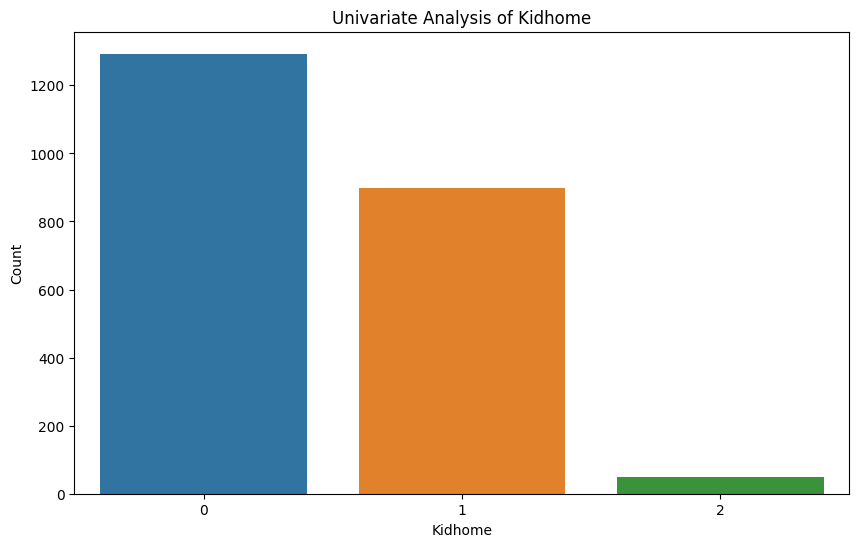

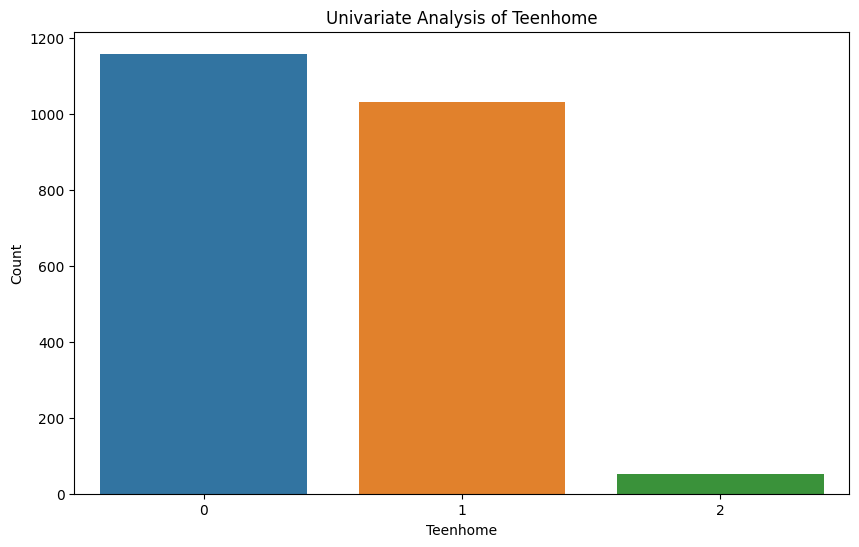

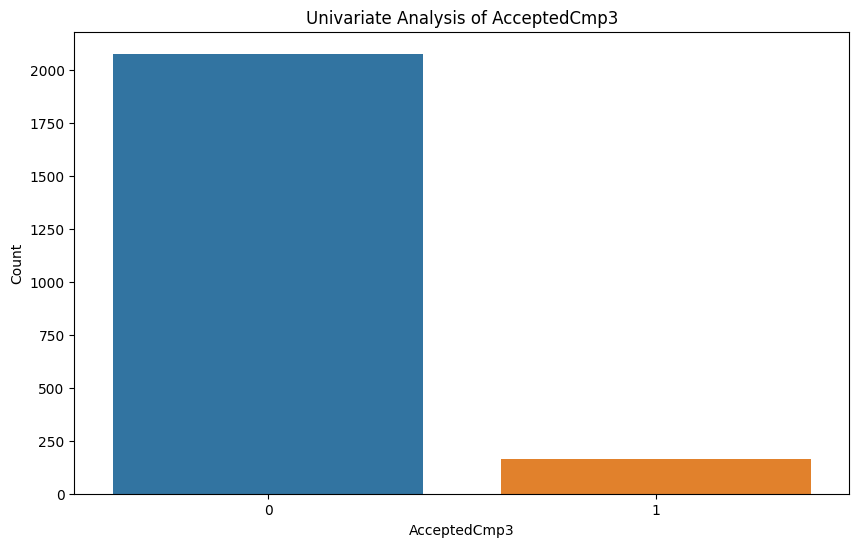

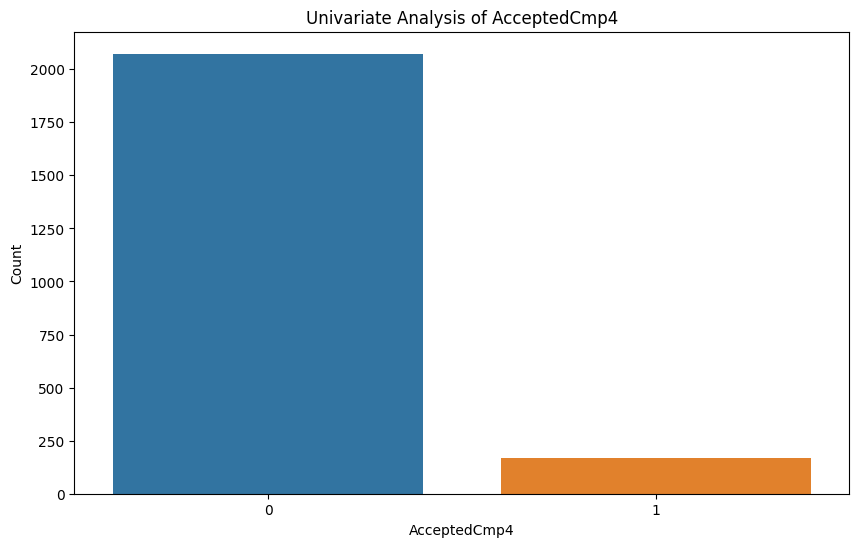

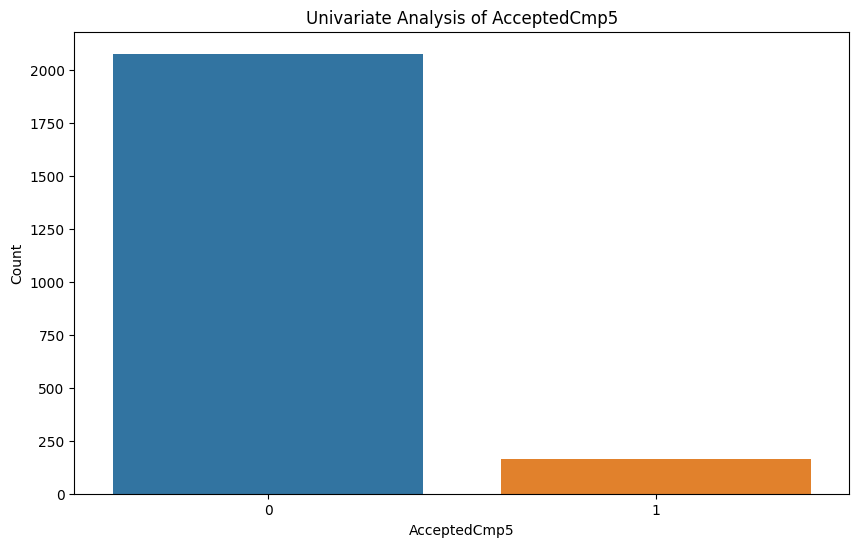

...

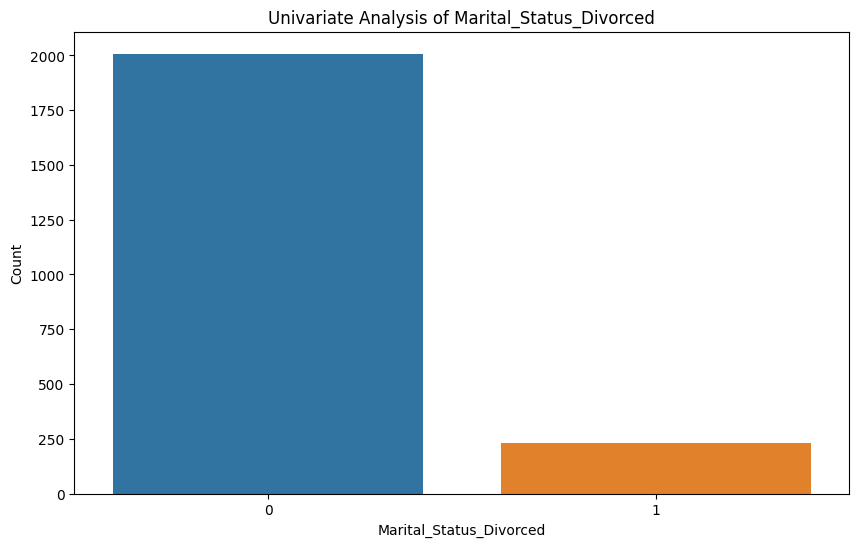

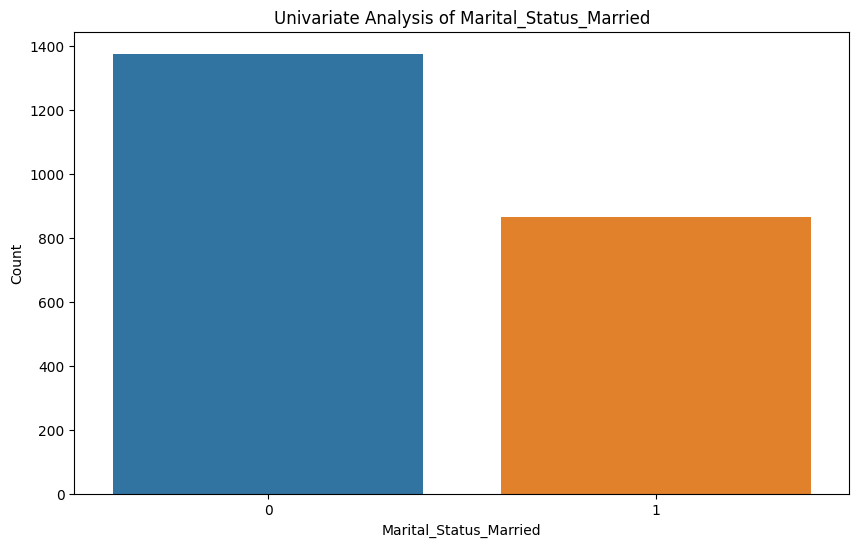

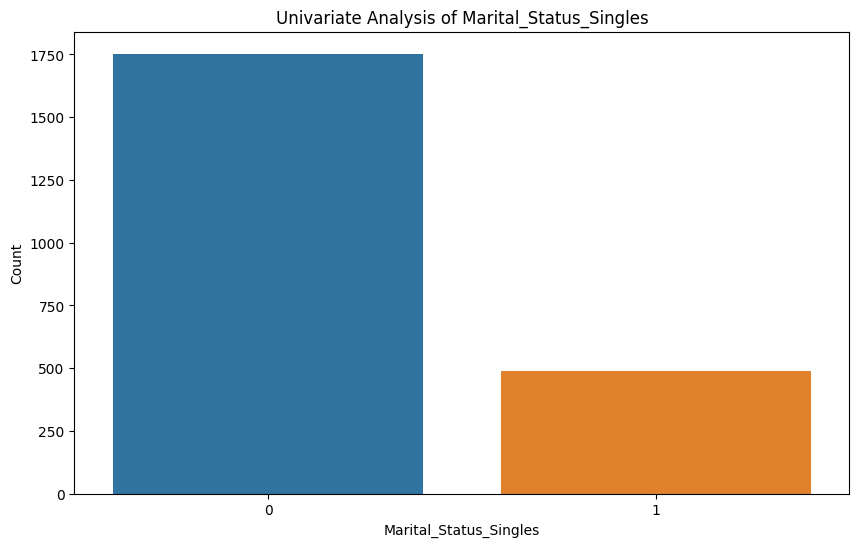

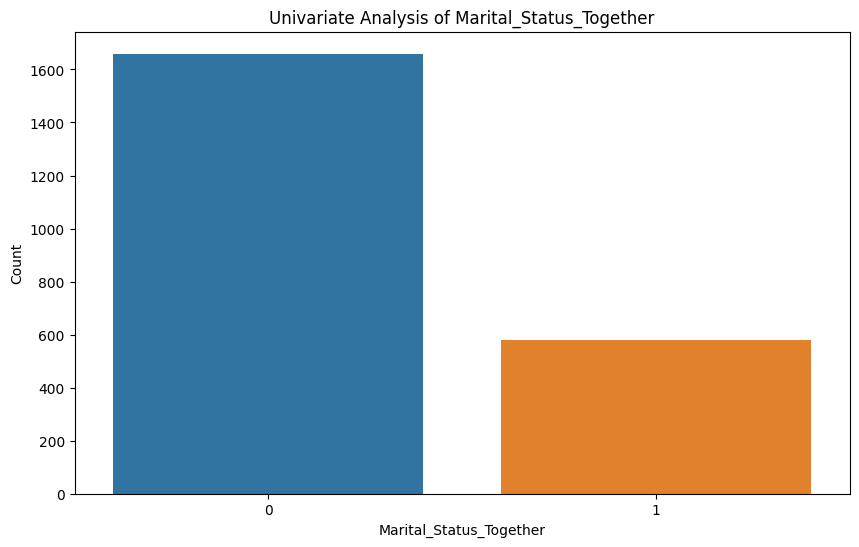

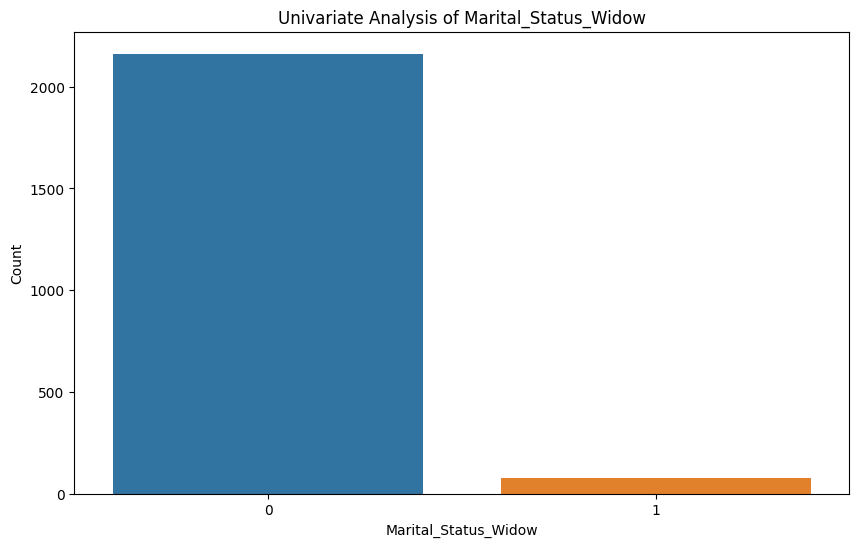

In [ ]:
# Univariate Analysis for each categorical column in the data
for column in cata_cols:
    # Frequency distribution for each categorical column
    value_counts = data_encoded[column].value_counts()

    # Plot a bar chart
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=data_encoded, order=value_counts.index)
    plt.title(f'Univariate Analysis of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

Income
Skew : 6.76
Recency
Skew : -0.0
MntWines
Skew : 1.18
MntFruits
Skew : 2.1
MntMeatProducts
Skew : 2.08
MntFishProducts
Skew : 1.92
MntSweetProducts
Skew : 2.14
MntGoldProds
Skew : 1.89
NumDealsPurchases
Skew : 2.42
NumWebPurchases
Skew : 1.38
NumCatalogPurchases
Skew : 1.88
NumStorePurchases
Skew : 0.7
NumWebVisitsMonth
Skew : 0.21


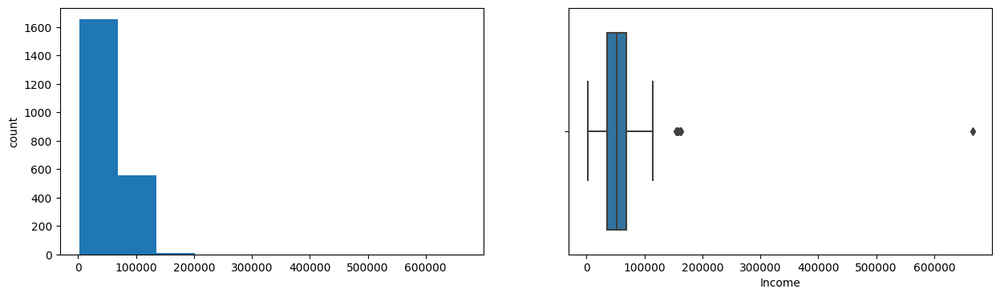

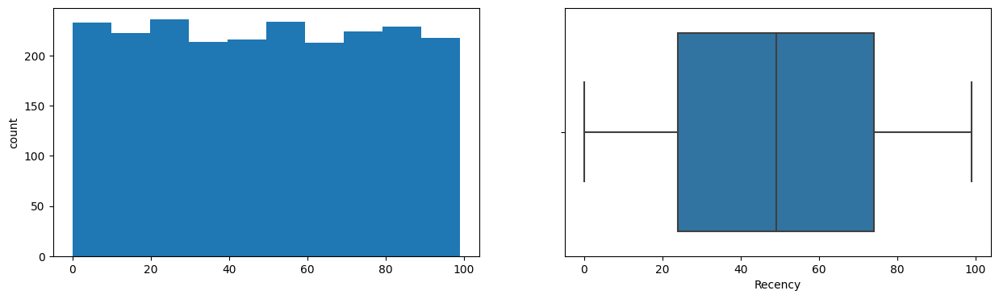

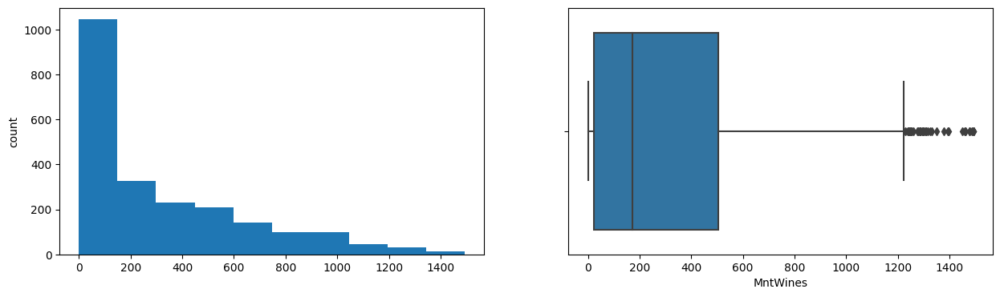

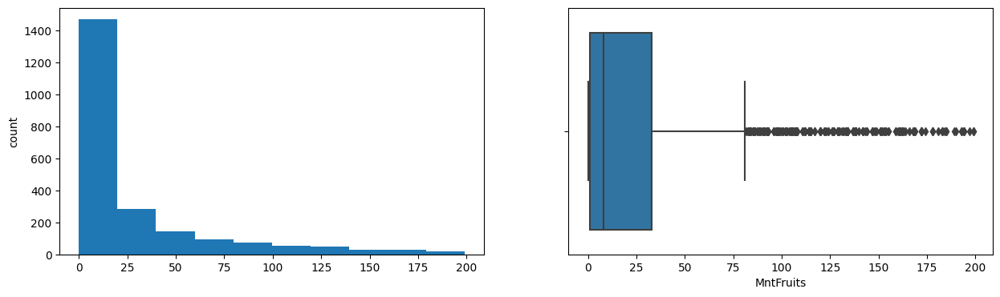

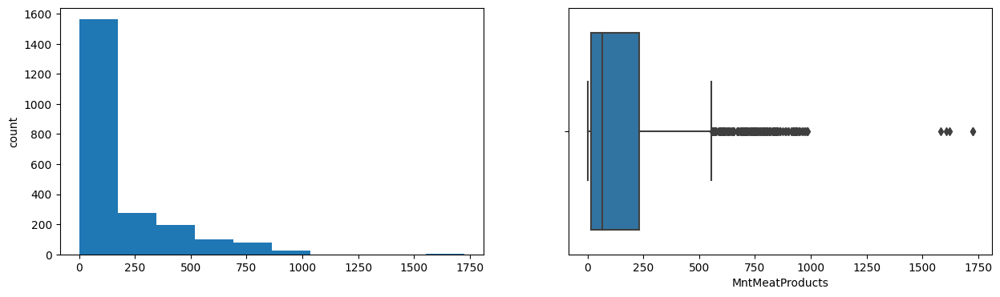

...

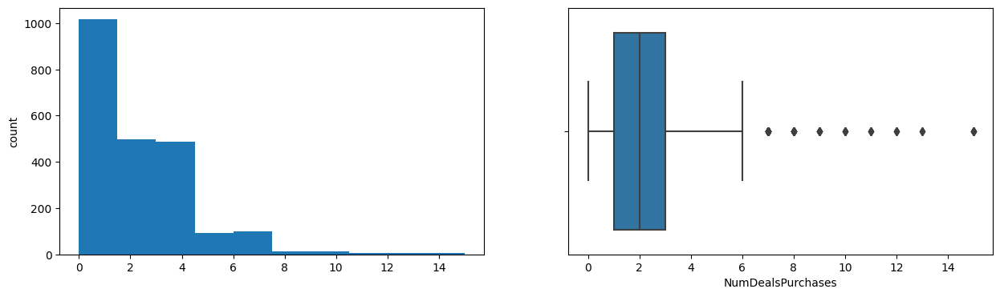

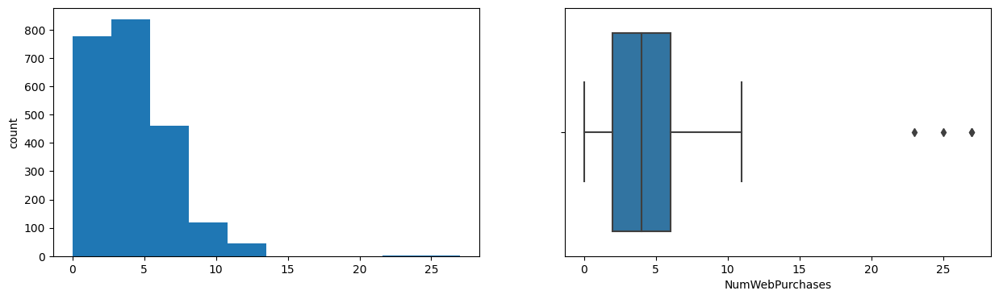

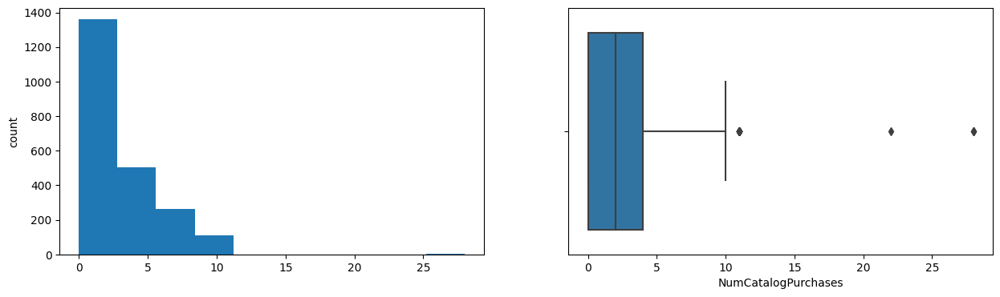

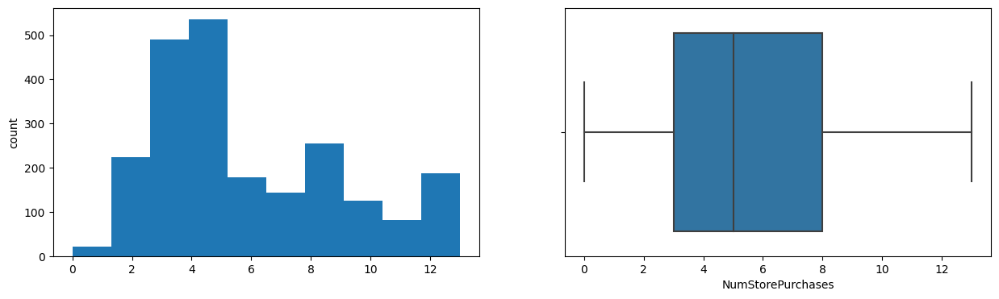

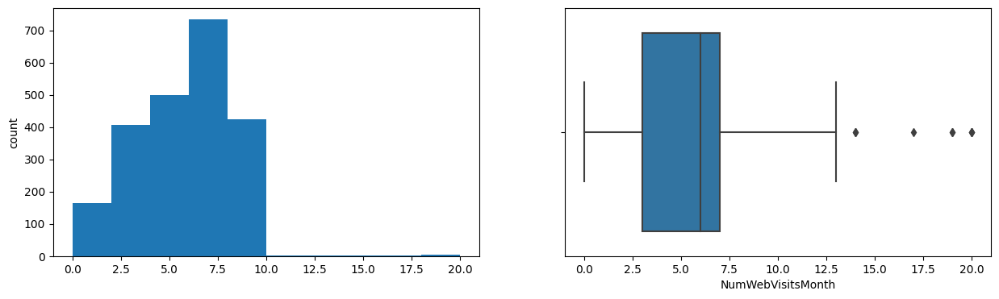

In [ ]:
# check the distribution and outliers for each Numerical column in the data
for col in nums_cols[1:]:
    print(col)

    print('Skew :', round(data_encoded[col].skew(), 2))

    plt.figure(figsize = (15, 4))

    plt.subplot(1, 2, 1)

    data_encoded[col].hist(bins = 10, grid = False)

    plt.ylabel('count')

    plt.subplot(1, 2, 2)

    sns.boxplot(x = data_encoded[col])

plt.show()


### **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

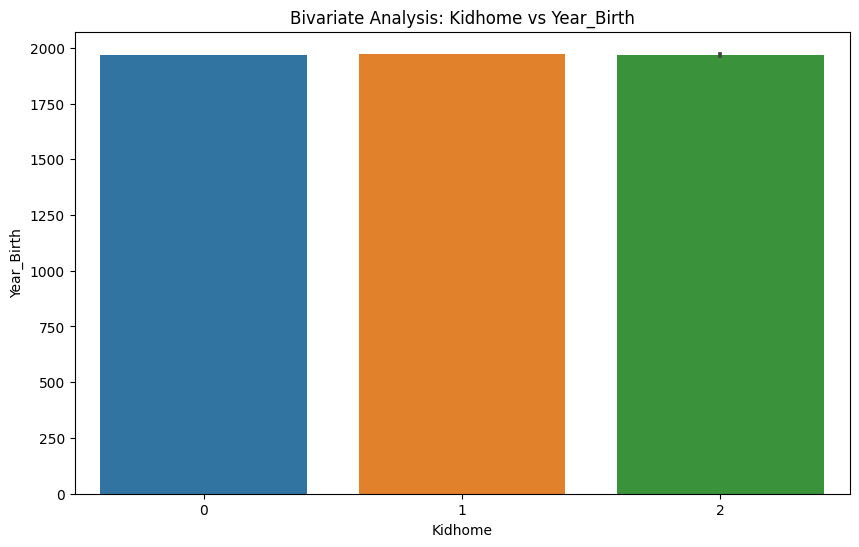

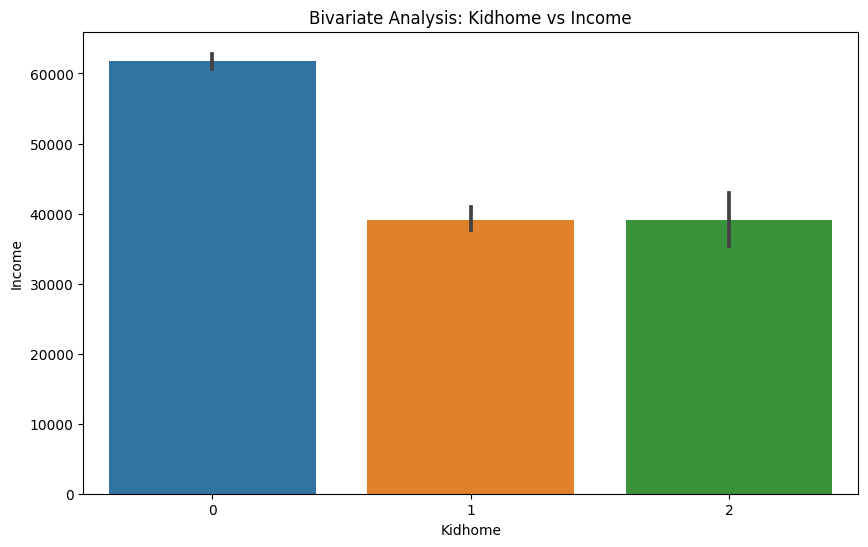

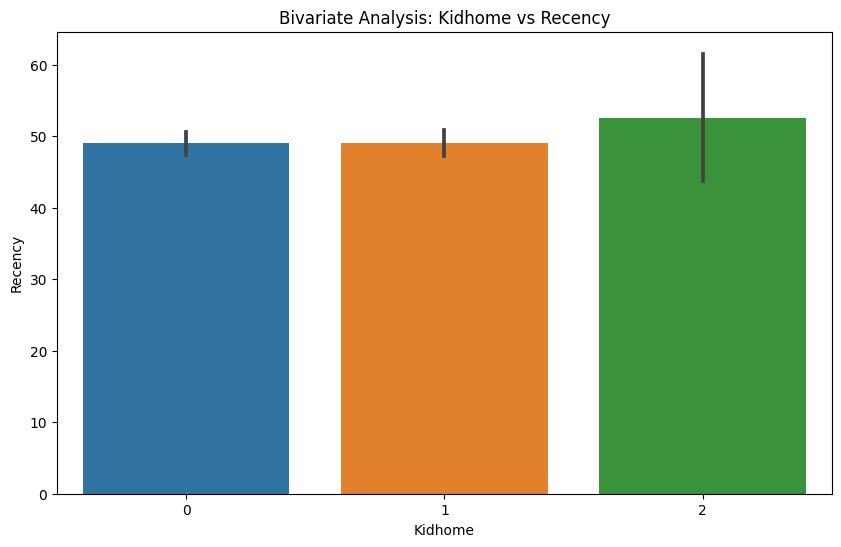

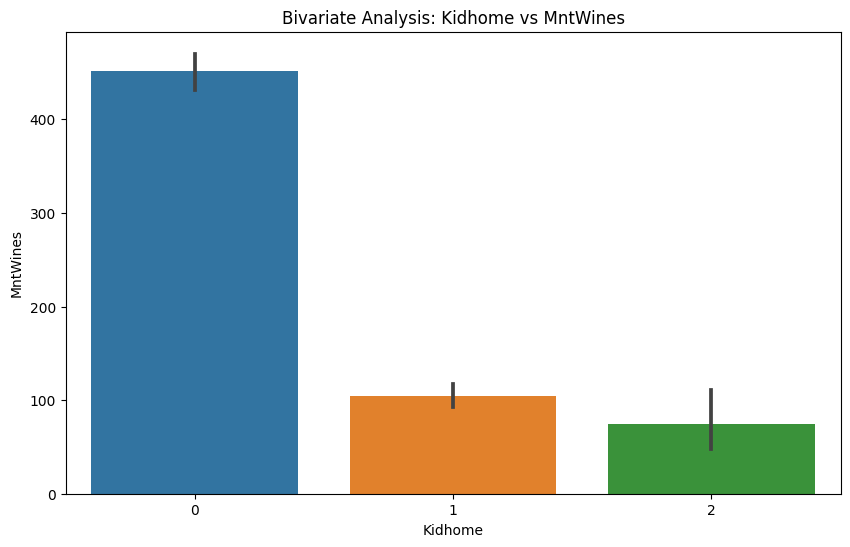

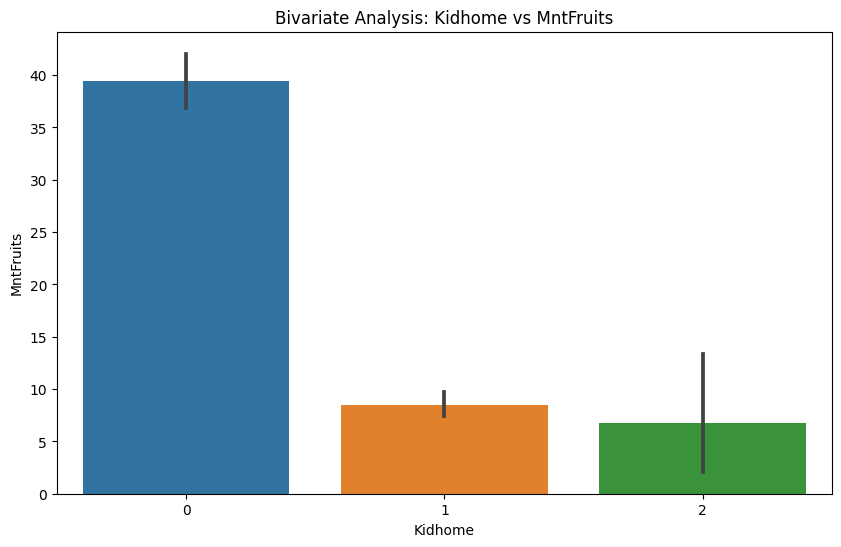

...

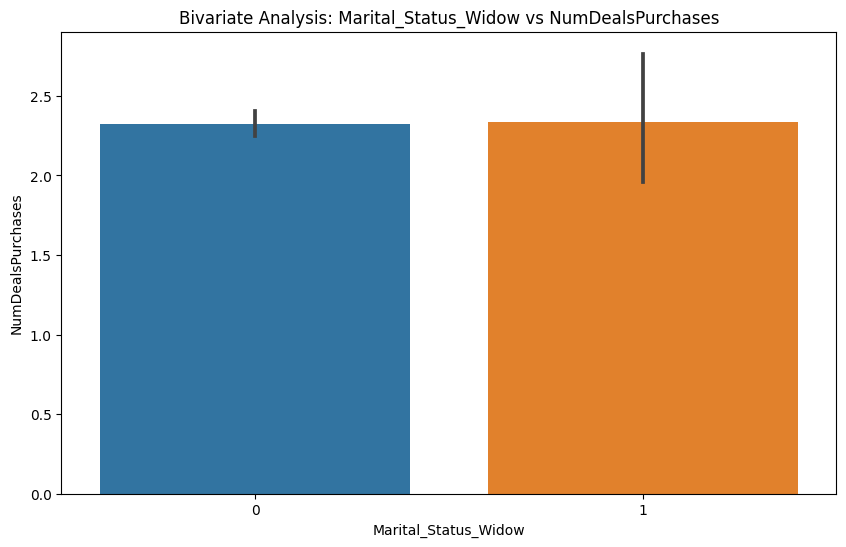

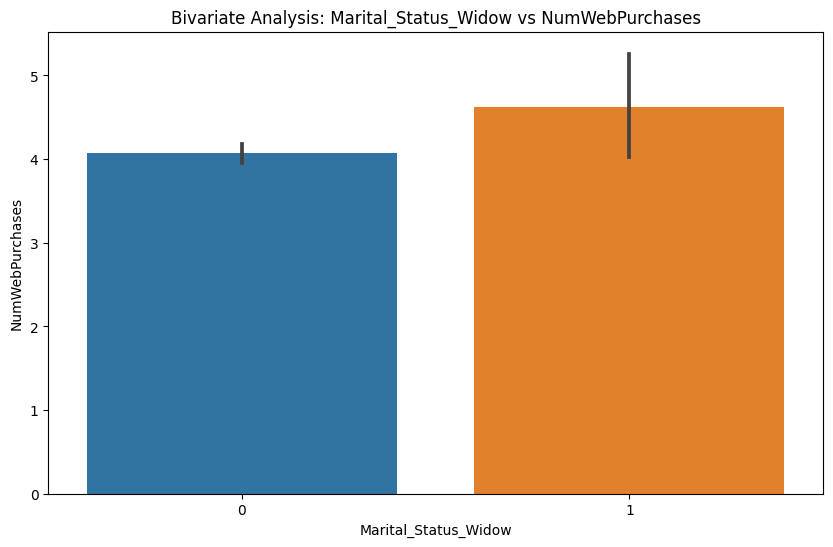

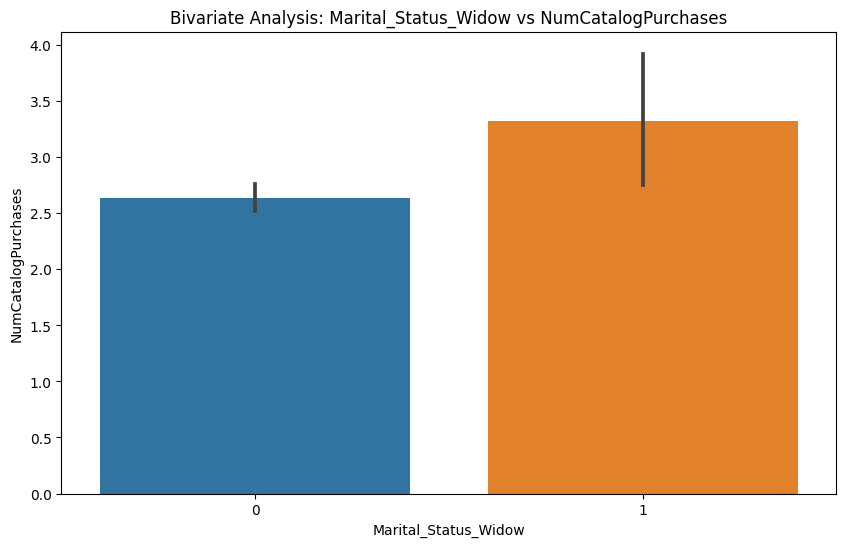

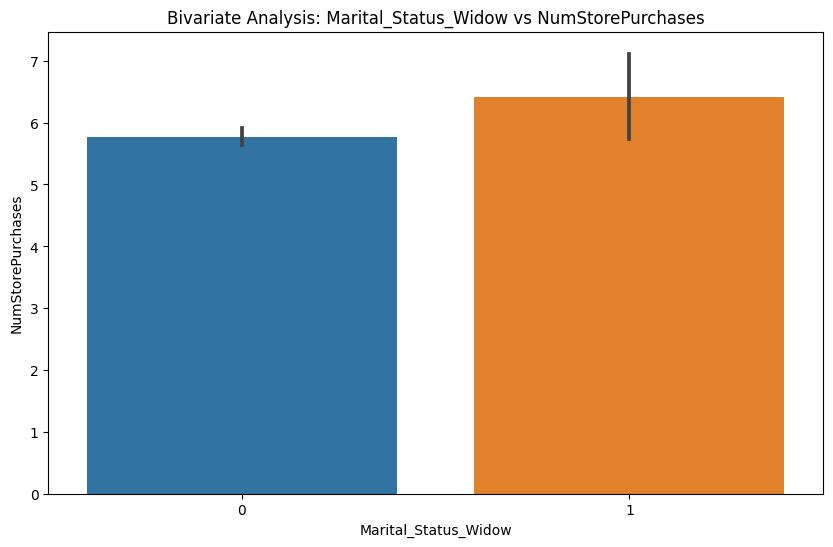

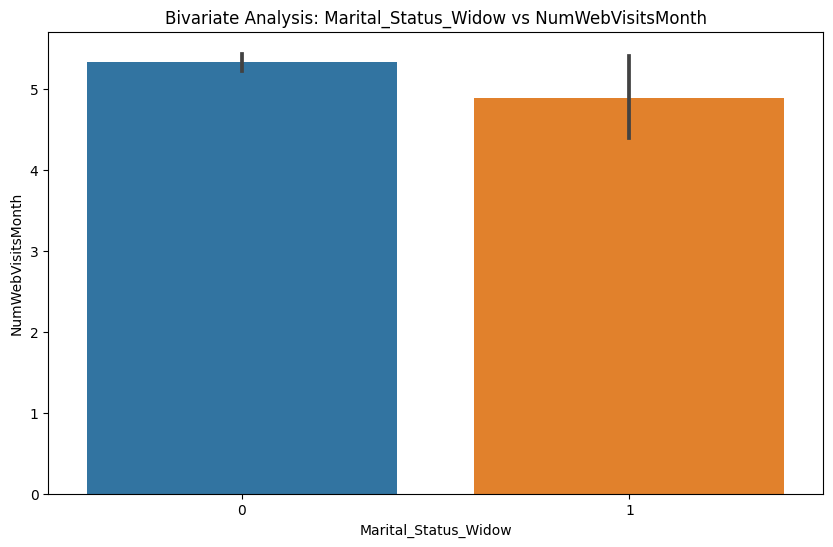

In [ ]:
for cat_column in cata_cols:
    for num_column in nums_cols:
        plt.figure(figsize=(10, 6))
        if len(data_encoded[cat_column].unique()) <= 10:
            sns.barplot(x=cat_column, y=num_column, data=data_encoded)
        else:
            sns.boxplot(x=cat_column, y=num_column, data=data_encoded)
        plt.title(f'Bivariate Analysis: {cat_column} vs {num_column}')
        plt.xlabel(cat_column)
        plt.ylabel(num_column)
        plt.show()

### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values

**Think About It:**

- Can we extract the age of each customer and create a new feature?
- Can we find the total kids and teens in the home?
- Can we find out how many members each family has?
- Can we find the total amount spent by the customers on various products?
- Can we find out how long the customer has been with the company?
- Can we find out how many offers the customers have accepted?
- Can we find out amount spent per purchase?



In [ ]:
# Since Income is skewed, I'm imputing it's missing values with the median

for Income in data_encoded.columns:
    data_encoded[Income].fillna(value = data_encoded[Income].median(), inplace = True)

In [ ]:
from datetime import datetime

# Extract the current year
current_year = datetime.now().year

# Create a new feature 'Age'
data_encoded['Age'] = current_year - data_encoded['Year_Birth']

# Create a new feature 'TotalChildren'
data_encoded['TotalChildren'] = data_encoded[['Kidhome', 'Teenhome']].sum(axis=1)

# Create a new feature ' HH ' representing household number
data_encoded['HH'] = data_encoded[['Marital_Status_Divorced', 'Marital_Status_Singles', 'Marital_Status_Together',
                                   'Marital_Status_Married', 'Marital_Status_Widow', 'TotalChildren']].sum(axis=1)

# Create a new feature 'TotalSpent'
data_encoded['TotalSpent'] = data_encoded[['MntWines', 'MntFruits','MntMeatProducts',
                                           'MntFishProducts','MntSweetProducts']].sum(axis=1)

# Create a new feature 'Tenure'
data_encoded['Tenure'] = current_year - data_encoded['Recency']

# Create a new feature 'OfrAccpt'
data_encoded['OfrAccpt'] = data_encoded[['Response', 'AcceptedCmp2',
                                         'AcceptedCmp1','AcceptedCmp5','AcceptedCmp4','AcceptedCmp3']].sum(axis=1)

# Create a new feature 'TotalPurchase'
data_encoded['TotalPurchase'] = data_encoded[['NumDealsPurchases', 'NumWebPurchases',
                                         'NumCatalogPurchases','NumStorePurchases']].sum(axis=1)

# Create a new feature 'Spent_per_Purchase'
data_encoded['Spent_per_Purchase'] = data_encoded['TotalSpent'] / data_encoded['TotalPurchase']


data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Year_Birth               2240 non-null   int64  
 1   Income                   2240 non-null   float64
 2   Kidhome                  2240 non-null   int64  
 3   Teenhome                 2240 non-null   int64  
 4   Recency                  2240 non-null   int64  
 5   MntWines                 2240 non-null   int64  
 6   MntFruits                2240 non-null   int64  
 7   MntMeatProducts          2240 non-null   int64  
 8   MntFishProducts          2240 non-null   int64  
 9   MntSweetProducts         2240 non-null   int64  
 10  MntGoldProds             2240 non-null   int64  
 11  NumDealsPurchases        2240 non-null   int64  
 12  NumWebPurchases          2240 non-null   int64  
 13  NumCatalogPurchases      2240 non-null   int64  
 14  NumStorePurchases       

## **Important Insights from EDA and Data Preprocessing**

What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?

**EDA INSIGIHTS**
- Returning the unique observations in Marital_Status shows there are 8 categories with some having very few observations and seemingly having similar meaning. Therefore, I have combined these columns (YOLO, Absurd and Alone) with Single.
- Similarly, Education has 5 categories but since Master and 2n Cycle describe the same thing, they have been combined into a column named ‘Masters’

**UNIVARIATE ANALYSIS OBSERVATION**

**Categorical Variables:**
- Most Customers have no kids. If they do, they are more likely to have one rather than two.
- Customers are least likely to accept a 2nd run of a campaign compared to 1-5 runs.
- Most customers are college graduates and married.
- Based on this information, it is likely that the majority of the company’s customers are young educated couples with no kids (Household of 2 with possibly good disposable income).

**Numerical Variables**:
- Recency is almost uniformly distributed
- Income is positively skewed with very few observations in the ~150,000 and >600,000 income range. Since the number of observations for these values are very few, we can assume they can be attributed to data entry error and remove them.
- Columns describing the amount spent on varying products are all positively skewed and contain outliers.
- All columns except NumStorePurchases and Recency have outliers.

**BIVARIATE ANALYSIS OBSERVATION**
- Customers with the Higher incomes are more likely to not have kids.
- Amount spent on varying products is highest in hh with 0 kids.
- Hh with kids are more likely to visit the company’s websites and make purchases with deals which makes intuitive sense.
- Birth year and Recency consistently are least likely to be correlated with other columns within the dataset.

## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

In [ ]:
# Creating a new df without the unnecessary columns
data_copy = data_encoded.drop( ['MntGoldProds','Year_Birth','Kidhome','Teenhome','Recency','Marital_Status_Divorced', 'Marital_Status_Singles', 'Marital_Status_Together',
                                   'Marital_Status_Married','MntWines', 'MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','Response', 'AcceptedCmp2',
                                    'AcceptedCmp1','AcceptedCmp5','AcceptedCmp4','AcceptedCmp3', 'NumWebPurchases','NumCatalogPurchases','NumStorePurchases',
                              'Education_Graduation','Education_Masters','Education_PhD'],axis=1)
data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Income                2240 non-null   float64
 1   NumDealsPurchases     2240 non-null   int64  
 2   NumWebVisitsMonth     2240 non-null   int64  
 3   Complain              2240 non-null   int64  
 4   Education_Basic       2240 non-null   uint8  
 5   Marital_Status_Widow  2240 non-null   uint8  
 6   Age                   2240 non-null   int64  
 7   TotalChildren         2240 non-null   int64  
 8   HH                    2240 non-null   int64  
 9   TotalSpent            2240 non-null   int64  
 10  Tenure                2240 non-null   int64  
 11  OfrAccpt              2240 non-null   int64  
 12  TotalPurchase         2240 non-null   int64  
 13  Spent_per_Purchase    2240 non-null   float64
dtypes: float64(2), int64(10), uint8(2)
memory usage: 214.5 KB


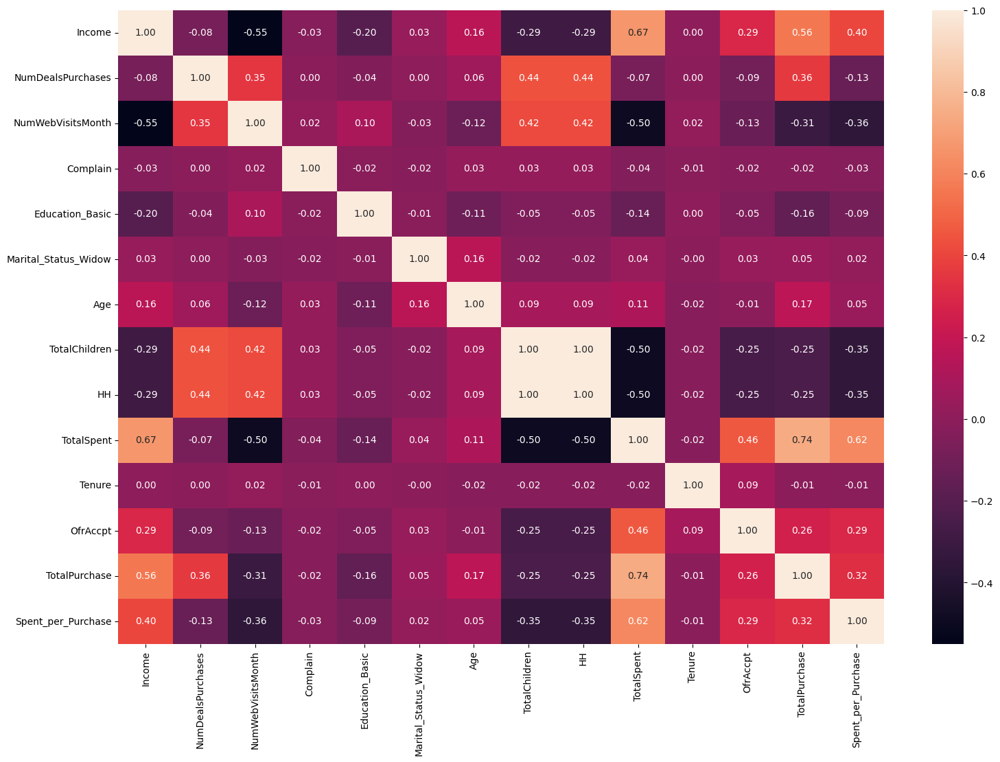

In [ ]:
# Plotting the correlation of variables in the new dataset
plt.figure(figsize = (18, 12))

sns.heatmap(data_copy.corr(numeric_only = True), annot = True, fmt = '0.2f')

plt.show()

In [ ]:
# Drop TotalSpent
data_copy.drop('TotalSpent',  axis=1, inplace=True)

In [ ]:
data_copy.describe()

,Income,NumDealsPurchases,NumWebVisitsMonth,Complain,Education_Basic,Marital_Status_Widow,Age,TotalChildren,HH,Tenure,OfrAccpt,TotalPurchase,Spent_per_Purchase
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,52237.975446,2.325000,5.316518,0.009375,0.024107,0.034375,54.194196,0.950446,1.950446,1973.890625,0.446429,14.862054,inf
std,25037.955891,1.932238,2.426645,0.096391,0.153416,0.182231,11.984069,0.751803,0.751803,28.962453,0.888508,7.677173,NaN
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.000000,0.000000,1.000000,1924.000000,0.000000,0.000000,0.466667
25%,35538.750000,1.000000,3.000000,0.000000,0.000000,0.000000,46.000000,0.000000,1.000000,1949.000000,0.000000,8.000000,7.800000
50%,51381.500000,2.000000,6.000000,0.000000,0.000000,0.000000,53.000000,1.000000,2.000000,1974.000000,0.000000,15.000000,20.809524
75%,68289.750000,3.000000,7.000000,0.000000,0.000000,0.000000,64.000000,1.000000,2.000000,1999.000000,1.000000,21.000000,42.030357
max,666666.000000,15.000000,20.000000,1.000000,1.000000,1.000000,130.000000,3.000000,4.000000,2023.000000,5.000000,44.000000,inf


In [ ]:
# Since Spent_per_Purchase contains inf numbers, I'm dropping it
data_copy.drop('Spent_per_Purchase',  axis=1, inplace=True)

In [ ]:
# Scaling the data
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data_copy), columns = data_copy.columns)
data_scaled.head()

,Income,NumDealsPurchases,NumWebVisitsMonth,Complain,Education_Basic,Marital_Status_Widow,Age,TotalChildren,HH,Tenure,OfrAccpt,TotalPurchase
0,0.235696,0.349414,0.693904,-0.097282,-0.157171,-0.188676,0.985345,-1.264505,-1.264505,-0.307039,0.623174,1.320826
1,-0.235454,-0.168236,-0.130463,-0.097282,-0.157171,-0.188676,1.235733,1.396361,1.396361,0.383664,-0.502560,-1.154596
2,0.773999,-0.685887,-0.542647,-0.097282,-0.157171,-0.188676,0.317643,-1.264505,-1.264505,0.798086,-0.502560,0.799685
3,-1.022355,-0.168236,0.281720,-0.097282,-0.157171,-0.188676,-1.268149,0.065928,0.065928,0.798086,-0.502560,-0.894025
4,0.241888,1.384715,-0.130463,-0.097282,-0.157171,-0.188676,-1.017761,0.065928,0.065928,-1.550305,-0.502560,0.539114


In [ ]:
# Creating copy of the data to store labels from each algorithm
data_scaled_copy = data_scaled.copy(deep = True)

**Feature Selection Reasoning**
- I opted for using the new features that have been created by combining the existing ones instead of including all columns  to avoid redundancy.
- The only exception is ‘NumDealsPurchases’ because the bivariate analysis shows this variable behaves differently when compared to other variables describing where customers were making their purchases. Therefore I included it to avoid losing this information.
- Looking at the Marital_Status and Education variables in the bivariate analysis shows that Marital_Status_Widow  and Education_Basic vary the most when plotted against other variables. Therefore, I’ve included only these two from among Marital_Status and Education variables for Profiling purposes.
- Because TotalSpent and TotalPurchase have a high correlation coefficient of 0.74, I’ve dropped TotalSpent.


## **Applying T-SNE and PCA to the data to visualize the data distributed in 2 dimensions**

### **Applying T-SNE**

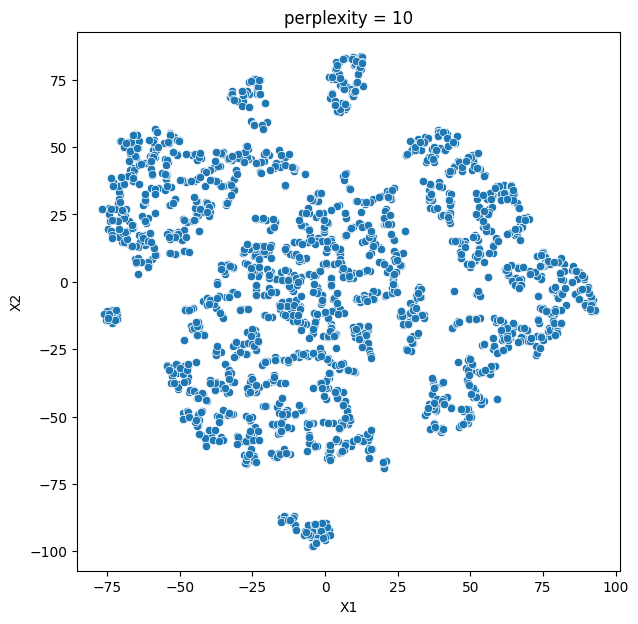

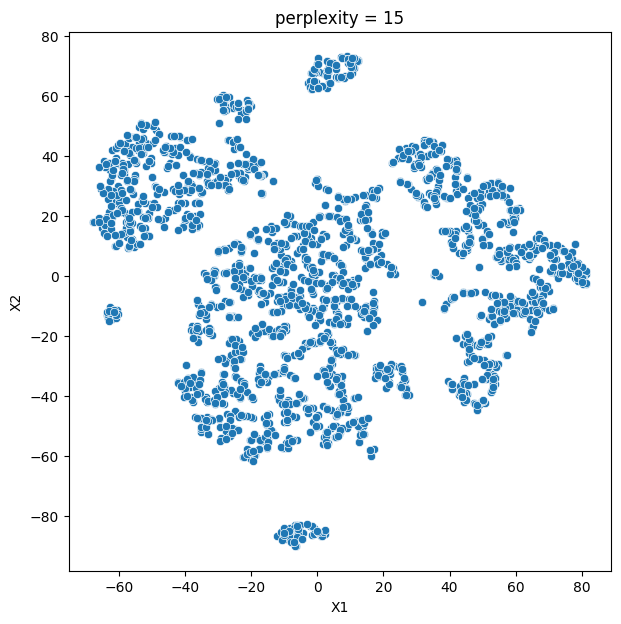

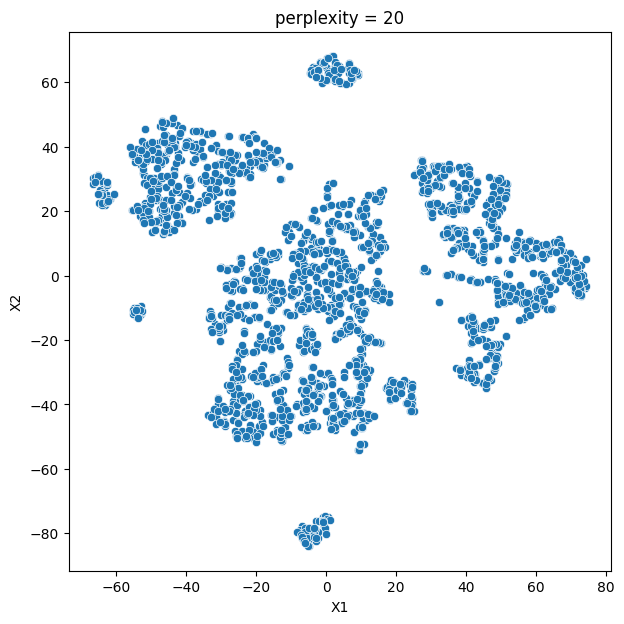

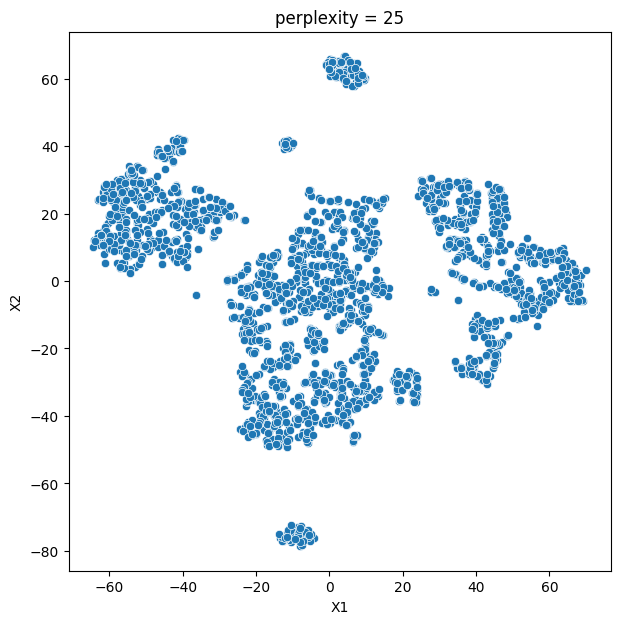

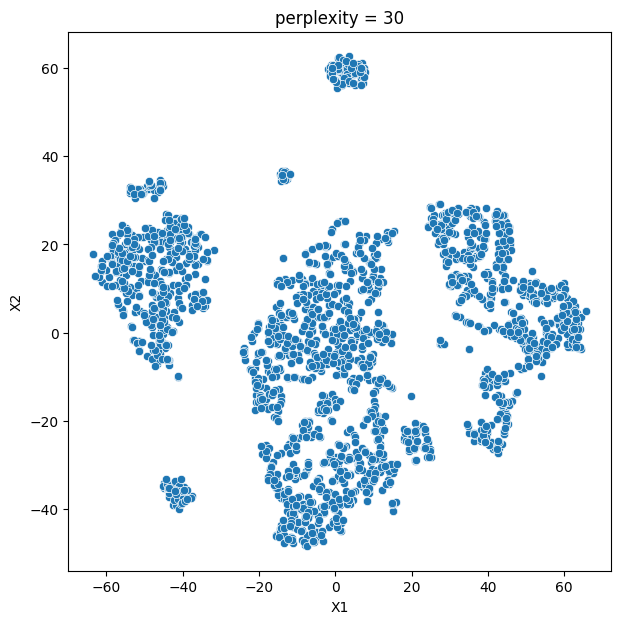

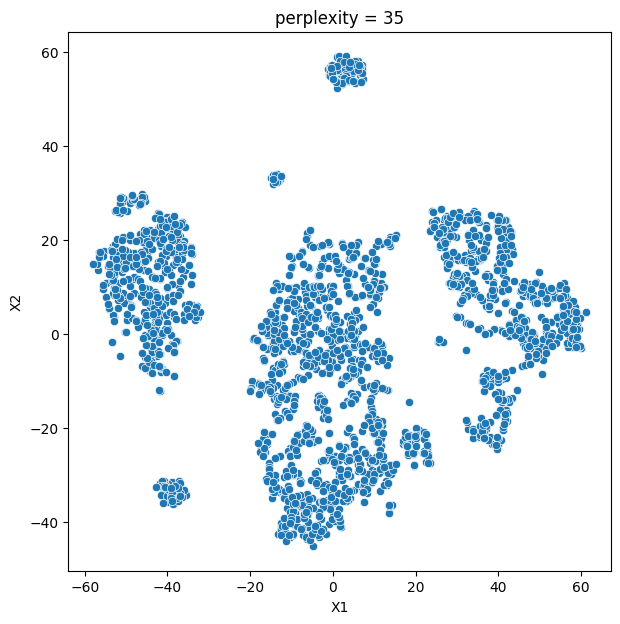

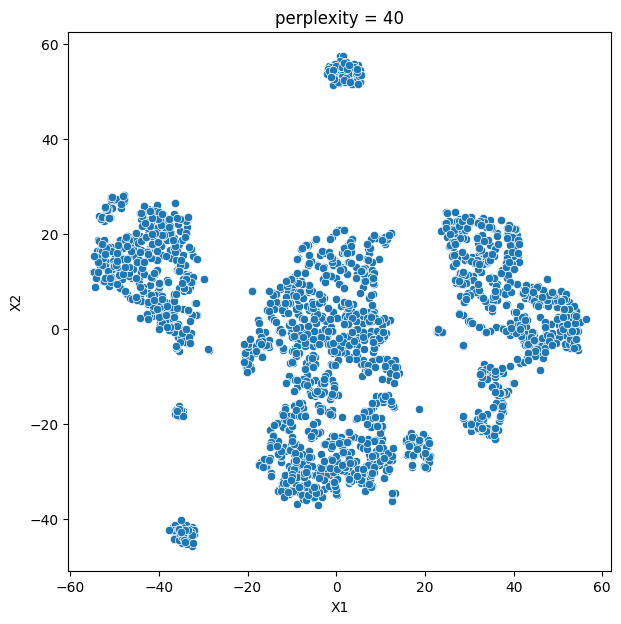

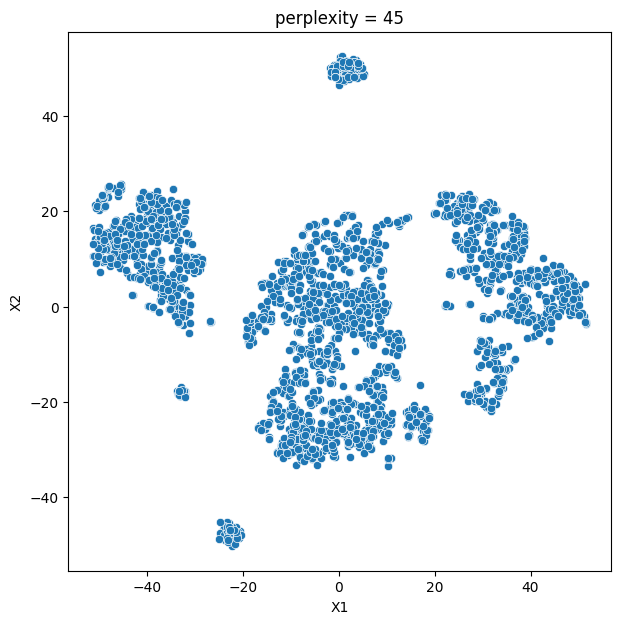

In [ ]:
for i in range(10, 50, 5):
    tsne = TSNE(n_components = 2, random_state = 1, perplexity = i)

    data_tsne = tsne.fit_transform(data_scaled)

    data_tsne = pd.DataFrame(data_tsne)

    data_tsne.columns = ['X1', 'X2']

    plt.figure(figsize = (7,7))

    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)

    plt.title("perplexity = {}".format(i))

**Observation and Insights:**
- From the figures above, we can deduct that a perplexity of 20  or 25 best captures the underlying patterns in the data.
- In the figure for perplexity 20, we see 6 distinct groups.


### **Applying PCA**

**Think about it:**
- Should we apply clustering algorithms on the current data or should we apply PCA on the data before applying clustering algorithms? How would this help?

In [ ]:
data_scaled.describe()

,Income,NumDealsPurchases,NumWebVisitsMonth,Complain,Education_Basic,Marital_Status_Widow,Age,TotalChildren,HH,Tenure,OfrAccpt,TotalPurchase
count,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03
mean,-4.361590e-17,-9.833404e-17,-6.344132e-17,-3.053113e-17,-3.806479e-17,-3.647876e-17,-1.681195e-16,4.123686e-17,1.395709e-16,3.172066e-18,-2.537653e-17,-1.110223e-17
std,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00
min,-2.017707e+00,-1.203537e+00,-2.191381e+00,-9.728167e-02,-1.571708e-01,-1.886762e-01,-2.269702e+00,-1.264505e+00,-1.264505e+00,-1.722981e+00,-5.025595e-01,-1.936308e+00
25%,-6.671053e-01,-6.858866e-01,-9.548307e-01,-9.728167e-02,-1.571708e-01,-1.886762e-01,-6.839101e-01,-1.264505e+00,-1.264505e+00,-8.596020e-01,-5.025595e-01,-8.940252e-01
50%,-3.421472e-02,-1.682363e-01,2.817201e-01,-9.728167e-02,-1.571708e-01,-1.886762e-01,-9.967091e-02,6.592771e-02,6.592771e-02,3.777284e-03,-5.025595e-01,1.797240e-02
75%,6.412408e-01,3.494139e-01,6.939037e-01,-9.728167e-02,-1.571708e-01,-1.886762e-01,8.184192e-01,6.592771e-02,6.592771e-02,8.671566e-01,6.231738e-01,7.996846e-01
max,2.454534e+01,6.561217e+00,6.052291e+00,1.027943e+01,6.362506e+00,5.300086e+00,6.326960e+00,2.726794e+00,2.726794e+00,1.696001e+00,5.126107e+00,3.796248e+00


In [ ]:
# Defining the number of principal components to generate
n = data_scaled.shape[1]

# Finding principal components for the data
pca1 = PCA(n_components = n, random_state = 1)
data_pca = pd.DataFrame(pca1.fit_transform(data_scaled))

# The percentage of variance explained by each principal component
exp_var1 = pca1.explained_variance_ratio_

In [ ]:
# Find the least number of components that can explain more than 70% variance
sum = 0

for ix, i in enumerate(exp_var1):

    sum = sum + i

    if(sum>0.70):
        print("Number of PCs that explain at least 70% variance: ", ix + 1)
        break

Number of PCs that explain at least 70% variance:  6


In [ ]:
# Making a new dataframe with first 6 principal components as columns and original features as indices
cols = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6']

pc1 = pd.DataFrame(np.round(pca1.components_.T[:, 0:6], 2), index = data_scaled.columns, columns = cols)
pc1

,PC1,PC2,PC3,PC4,PC5,PC6
Income,0.38,0.37,0.01,-0.12,0.02,-0.11
NumDealsPurchases,-0.25,0.46,-0.37,0.01,-0.18,0.26
NumWebVisitsMonth,-0.41,-0.09,-0.26,0.15,-0.01,0.18
Complain,-0.03,0.01,0.17,-0.31,0.67,0.65
Education_Basic,-0.06,-0.31,-0.16,0.22,-0.30,0.47
Marital_Status_Widow,0.04,0.11,0.42,0.66,-0.13,0.27
Age,0.03,0.35,0.51,0.20,0.06,0.02
TotalChildren,-0.49,0.26,0.07,-0.03,0.07,-0.15
HH,-0.49,0.26,0.07,-0.03,0.07,-0.15
Tenure,0.01,-0.01,-0.33,0.52,0.58,-0.28


**Observation and Insights:**

- The first principal components seems to be highly positively related to income and negatively correlated to Number of website visits per month, Total number of children and HH number.
- The second principal component seems highly positively related to Income, NumDealsPurchases, Age and Total Purchase.
- The third principal component, seems to be highly related to NumDealsPurchases as well in addition to Widow marital status and Age.
- The fourth principal component is also highly related to Wido marital status and Tenure.
- The fifth principal component,inturn is highly related to Complain variable as well as tenure.
- Lastly, the sixth principal component is also highly related to the variable Complain and Basic educational status.

## **K-Means**

**Think About It:**

- How do we determine the optimal K value from the elbow curve?
- Which metric can be used to determine the final K value?

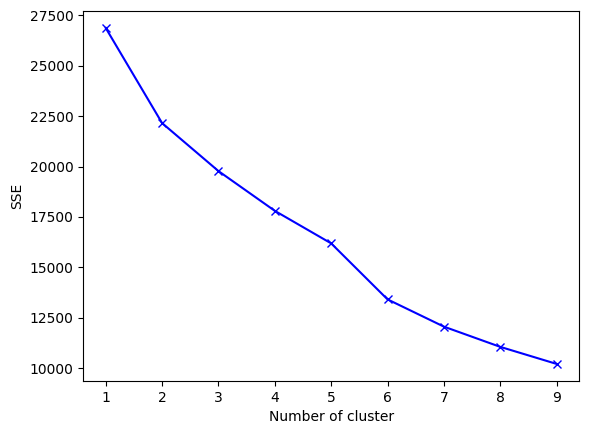

In [ ]:
# Empty dictionary to store the SSE for each value of K
sse = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm.
# Use inertia attribute from the clustering object and store the inertia value for that K
for k in range(1, 10):
    kmeans = KMeans(n_clusters = k, random_state = 1).fit(data_scaled)

    sse[k] = kmeans.inertia_

# Elbow plot
plt.figure()

plt.plot(list(sse.keys()), list(sse.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("SSE")

plt.show()

### **Applying KMeans on the PCA data and visualize the clusters**

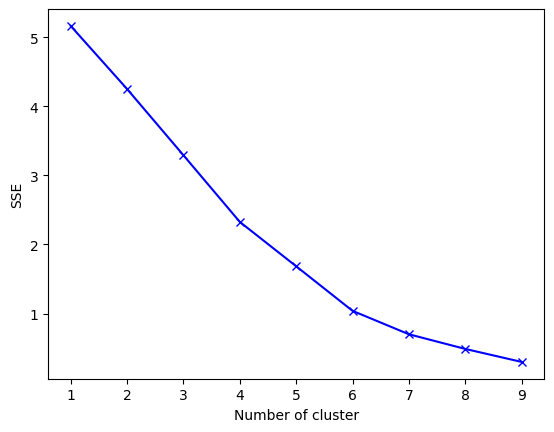

In [ ]:
# Empty dictionary to store the SSE for each value of K
sse = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm.
# Use inertia attribute from the clustering object and store the inertia value for that K
for k in range(1, 10):
    kmeans = KMeans(n_clusters = k, random_state = 1).fit(pc1)

    sse[k] = kmeans.inertia_

# Elbow plot
plt.figure()

plt.plot(list(sse.keys()), list(sse.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("SSE")

plt.show()

### **Cluster Profiling**

In [ ]:
kmeans = KMeans(n_clusters = 6, random_state = 1)

kmeans.fit(data_scaled)

# Adding predicted labels to the original data and the scaled data
data_scaled_copy['KMeans_Labels'] = kmeans.predict(data_scaled)

data_copy['KMeans_Labels'] = kmeans.predict(data_scaled)

In [ ]:
data_copy['KMeans_Labels'].value_counts()

1    878
0    644
2    567
3     76
4     54
5     21
Name: KMeans_Labels, dtype: int64

In [ ]:
# Calculating the mean and the median of the original data for each label
mean = data_copy.groupby('KMeans_Labels').mean()

median = data_copy.groupby('KMeans_Labels').median()

df_kmeans = pd.concat([mean, median], axis = 0)

df_kmeans.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean','group_3 Mean', 'group_4 Mean', 'group_5 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median', 'group_5 Median']

df_kmeans.T

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_5 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median,group_5 Median
Income,57611.592391,34986.049544,75529.039683,56866.532895,20306.259259,45242.285714,57956.5,34566.0,75437.0,56551.0,20744.0,38998.0
NumDealsPurchases,4.181677,1.808656,1.061728,2.355263,1.796296,2.333333,4.0,2.0,1.0,2.0,1.0,2.0
NumWebVisitsMonth,5.864907,6.486333,2.774250,4.881579,6.870370,5.809524,6.0,7.0,2.0,5.0,7.0,7.0
Complain,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0
Education_Basic,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.0
Marital_Status_Widow,0.000000,0.000000,0.000000,1.000000,0.018519,0.000000,0.0,0.0,0.0,1.0,0.0,0.0
Age,58.071429,50.857631,54.268078,64.460526,45.537037,57.904762,58.0,50.0,53.0,65.5,44.0,59.0
TotalChildren,1.329193,1.224374,0.118166,0.881579,0.722222,1.190476,1.0,1.0,0.0,1.0,1.0,1.0
HH,2.329193,2.224374,1.118166,1.881579,1.722222,2.190476,2.0,2.0,1.0,2.0,2.0,2.0
Tenure,1972.569876,1974.455581,1974.553792,1974.223684,1974.555556,1969.952381,1972.0,1974.0,1975.0,1975.0,1975.0,1974.0


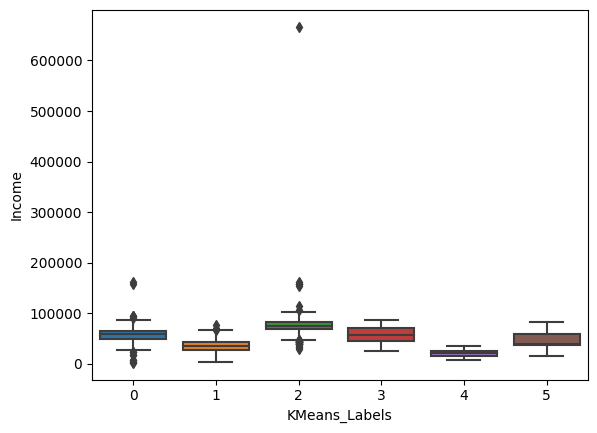

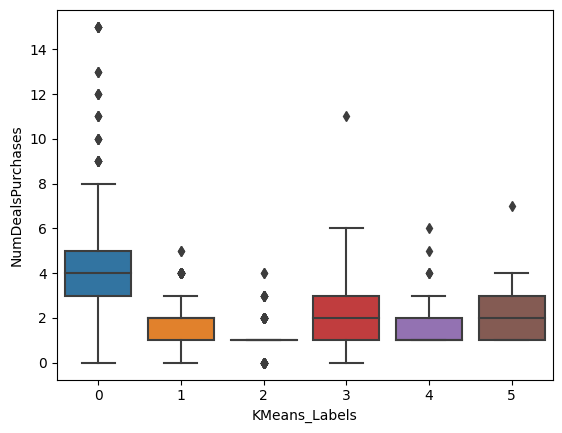

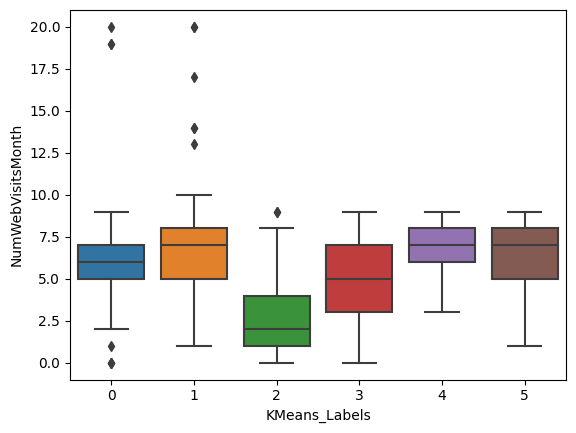

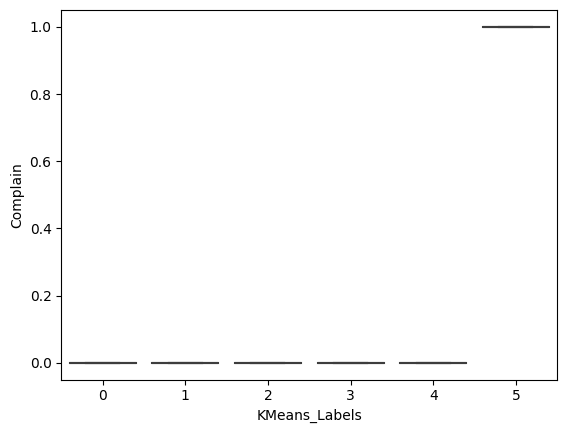

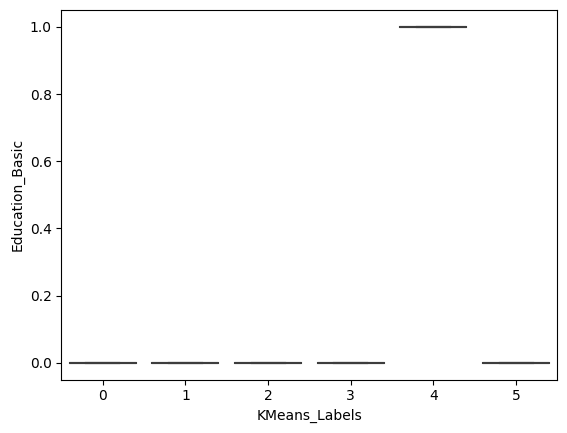

...

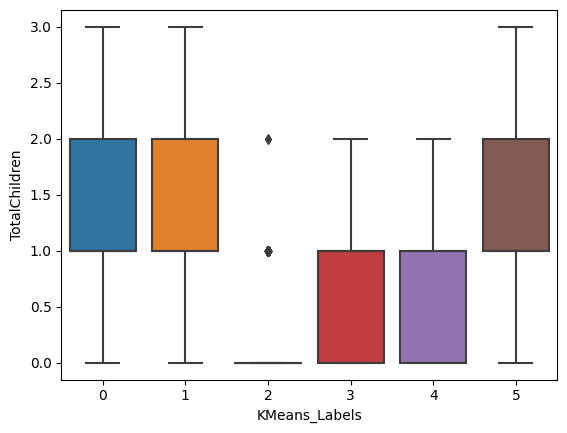

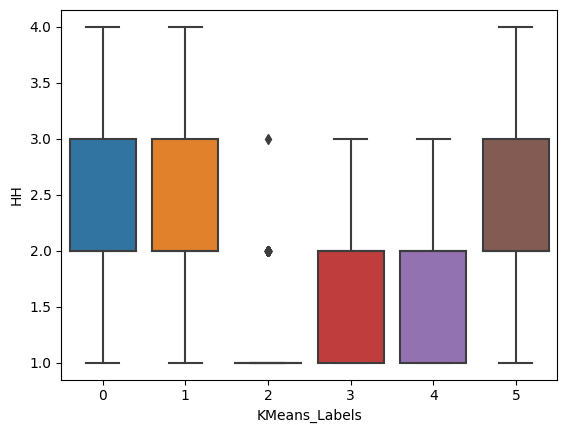

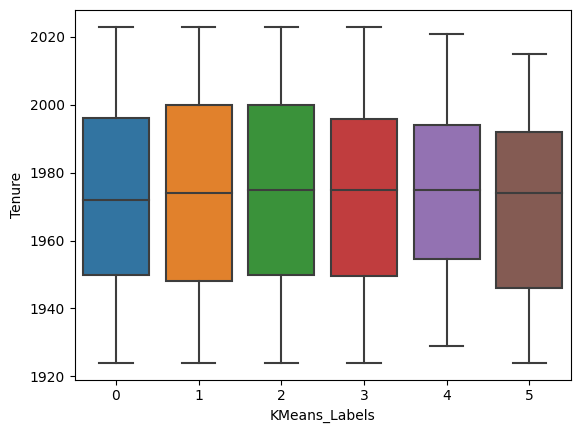

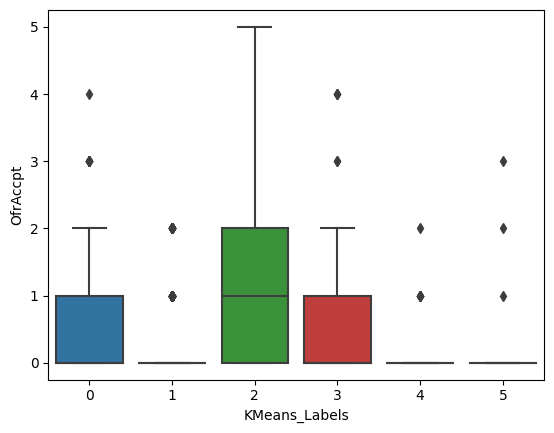

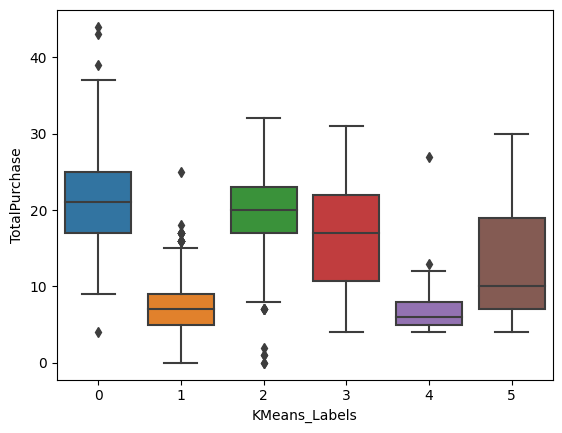

In [ ]:
cols_visualise = ['Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain', 'Education_Basic',
                  'Marital_Status_Widow', 'Age', 'TotalChildren', 'HH','Tenure','OfrAccpt','TotalPurchase']

for col in cols_visualise:
    sns.boxplot(x = 'KMeans_Labels', y = col, data = data_copy)
    plt.show()

**Observations and Insights:**

### **Describe the characteristics of each cluster**

**OBSERVATION**
- There are multiple overlaps between clusters meaning the method isn't segmenting the data in a way that gives a lot of insight.
- This suggests that K-Means isn't the best method to segment the data.

**Summary of each cluster:**

## **K-Medoids**

In [ ]:
# Creating copy of the data to store labels from each algorithm
data_copy1 = data_copy.copy(deep = True)

In [ ]:
kmedo = KMedoids(n_clusters = 6, random_state = 1)

kmedo.fit(data_copy)

data_copy1['kmedoLabels'] = kmedo.predict(data_copy)


In [ ]:
data_copy1.kmedoLabels.value_counts()

2    443
3    401
0    389
1    348
4    344
5    315
Name: kmedoLabels, dtype: int64

In [ ]:
# Calculating the mean and the median of the original data for each label
original_features = ['Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain', 'Education_Basic',
                  'Marital_Status_Widow', 'Age', 'TotalChildren', 'HH','Tenure','OfrAccpt','TotalPurchase']

mean = data_copy1.groupby('kmedoLabels').mean()

median = data_copy1.groupby('kmedoLabels').median()

df_kmedoids = pd.concat([mean, median], axis = 0)

df_kmedoids.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean','group_3 Mean', 'group_4 Mean', 'group_5 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median', 'group_5 Median']

df_kmedoids[original_features].T

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_5 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median,group_5 Median
Income,84662.426735,42999.675287,66843.740406,54117.314214,33258.334302,20196.212698,80739.0,42715.0,66664.0,54137.0,33459.0,21955.0
NumDealsPurchases,1.280206,2.767241,2.363431,3.259352,2.095930,2.133333,1.0,2.0,2.0,3.0,2.0,2.0
NumWebVisitsMonth,2.665810,6.347701,4.158014,5.591022,6.732558,7.184127,2.0,7.0,4.0,6.0,7.0,7.0
Complain,0.005141,0.020115,0.006772,0.004988,0.008721,0.012698,0.0,0.0,0.0,0.0,0.0,0.0
Education_Basic,0.000000,0.000000,0.000000,0.000000,0.014535,0.155556,0.0,0.0,0.0,0.0,0.0,0.0
Marital_Status_Widow,0.035990,0.043103,0.038375,0.047382,0.023256,0.012698,0.0,0.0,0.0,0.0,0.0,0.0
Age,55.300771,54.094828,56.586907,57.962594,51.296512,47.939683,54.0,53.0,57.0,58.0,50.0,47.0
TotalChildren,0.313625,1.344828,0.724605,1.226933,1.258721,0.930159,0.0,1.0,1.0,1.0,1.0,1.0
HH,1.313625,2.344828,1.724605,2.226933,2.258721,1.930159,1.0,2.0,2.0,2.0,2.0,2.0
Tenure,1973.419023,1972.281609,1974.367946,1973.269327,1976.450581,1973.574603,1973.0,1971.0,1973.0,1972.0,1976.5,1974.0


### **Visualize the clusters using PCA**

### **Cluster Profiling**

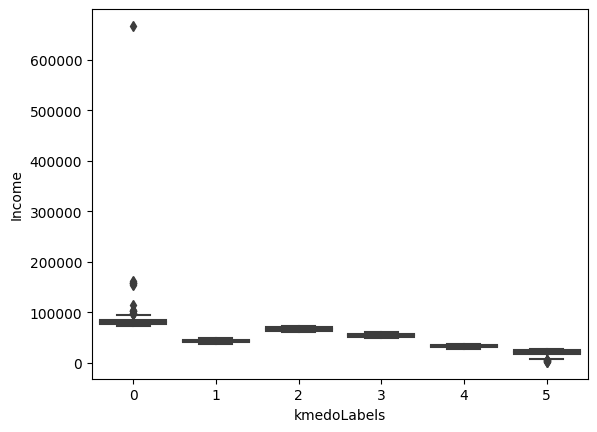

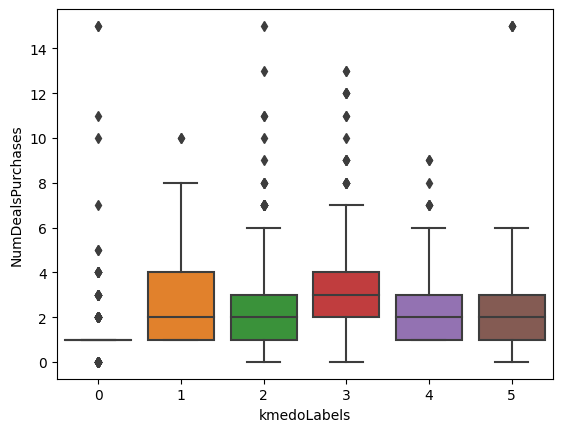

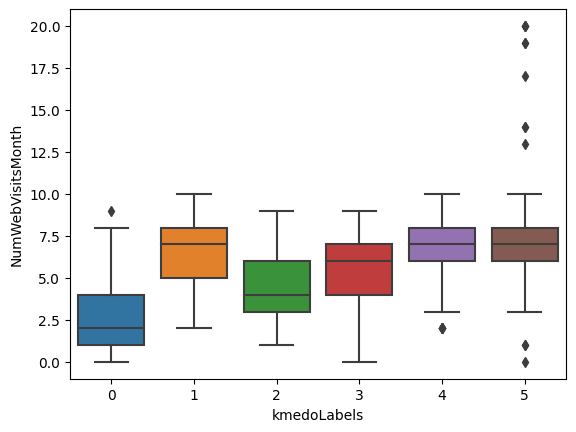

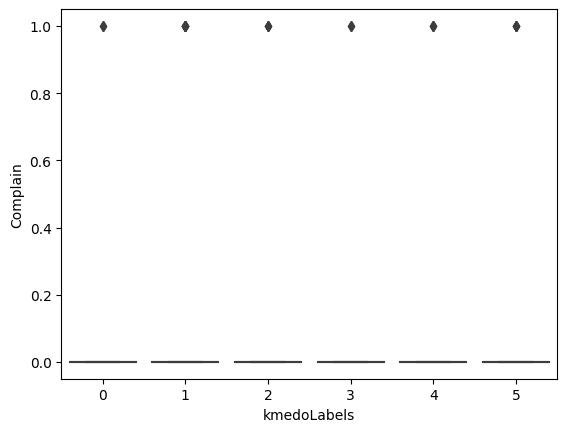

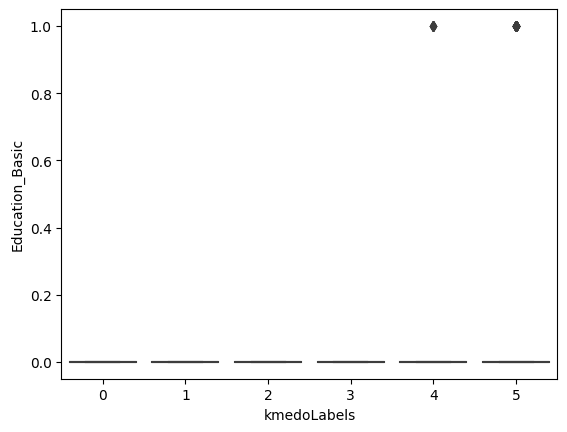

...

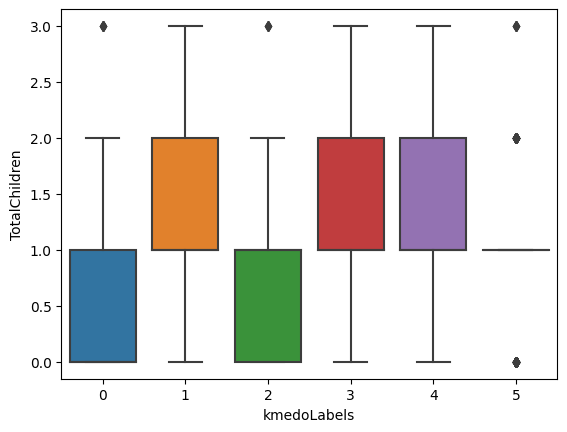

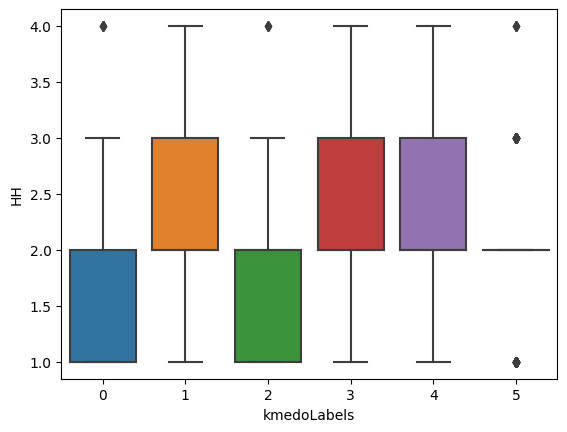

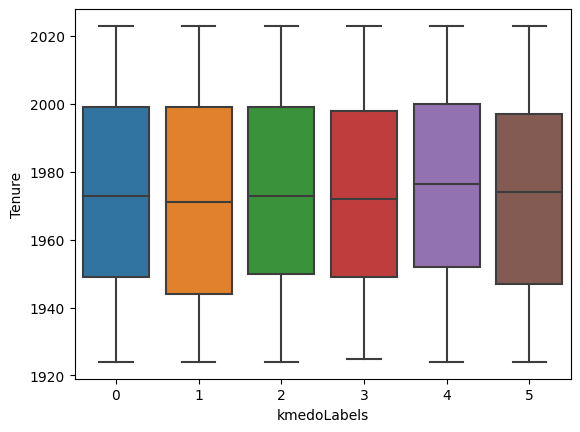

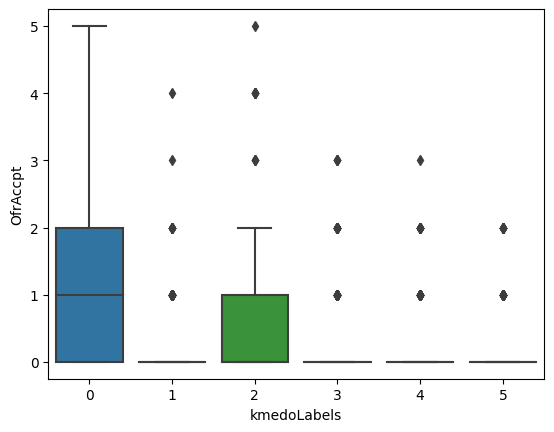

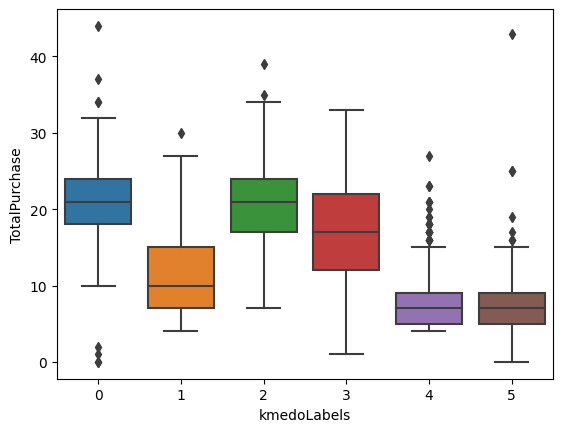

In [ ]:
for col in original_features:
    sns.boxplot(x = 'kmedoLabels', y = col, data = data_copy1)

    plt.show()

**Observations and Insights:**

### **Characteristics of each cluster**

**Summary for each cluster:**
- When plotted against TotalPurchase, the first third and fourth clusters describe customers with the highest total purchases while the fifth and sixth both describe customers with the lowest total purchase history.
- When plotted against housholdand total children, the clusters are identical. The first and third both describing the smallest households and second, fourth and fifth describing the largest households.

**Observations and Insights:**
- In terms of performance, the KMedoid method performed much better than the K-means one because the number of customers in each group was more evenly distributed.
- The clusters still largely overlap when plotted against most variables. The clearest distinction happens when plotted against income although some overlap still extists.

## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages
- Explore different linkages with each distance metric

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

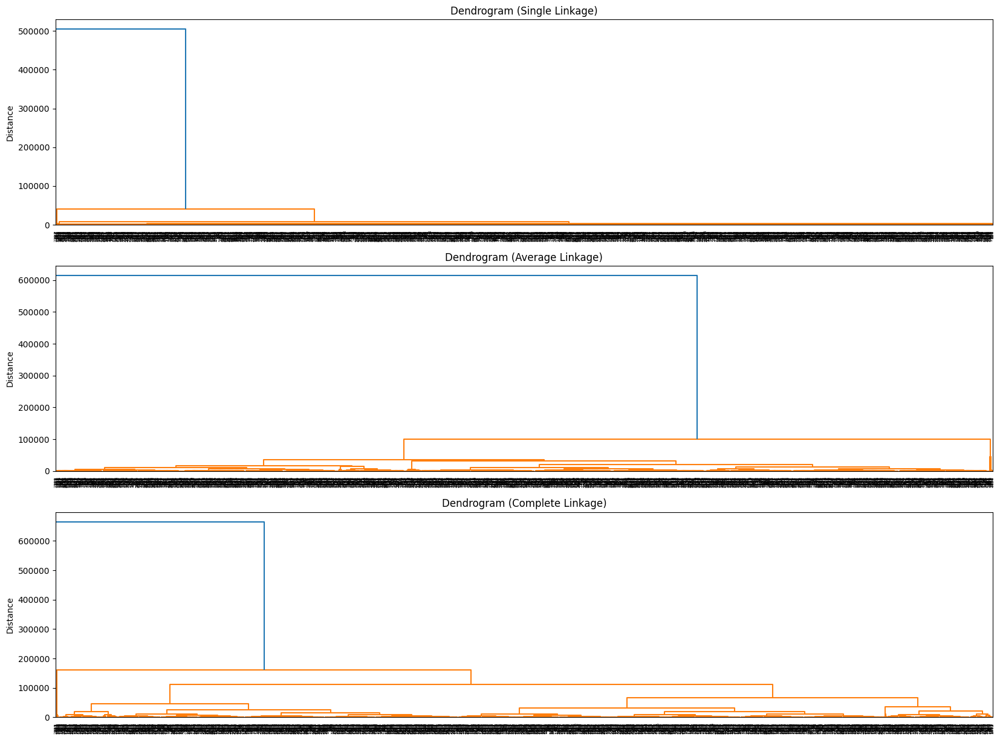

In [ ]:
# The List of all linkage methods to check
methods = ['single',
           'average',
           'complete']

# Create a subplot image
fig, axs = plt.subplots(len(methods), 1, figsize = (20, 15))

# Enumerate through the list of all methods above, get linkage and plot dendrogram
for i, method in enumerate(methods):
    Z = linkage(data_copy, metric = 'euclidean', method = method)

    dendrogram(Z, ax = axs[i]);

    axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')

    axs[i].set_ylabel('Distance')

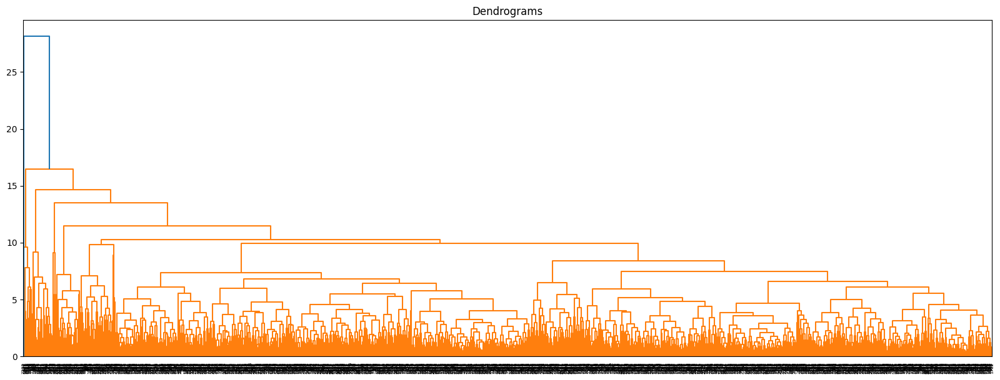

In [ ]:
plt.figure(figsize = (20, 7))

plt.title("Dendrograms")

dend = dendrogram(linkage(data_scaled, method = 'complete'))

plt.axhline(y = 99000, color = 'r', linestyle = '--')

**Think about it:**

- Can we clearly decide the number of clusters based on where to cut the dendrogram horizontally?
- What is the next step in obtaining number of clusters based on the dendrogram?
- Are there any distinct clusters in any of the dendrograms?

In [ ]:
# Clustering with 3 clusters
hierarchical = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'complete')

hierarchical.fit(data_scaled)

AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=3)

In [ ]:
data_scaled_copy['HCLabels'] = hierarchical.labels_

data_copy['HCLabels'] = hierarchical.labels_

In [ ]:
data_copy.HCLabels.value_counts()

0    2218
2      21
1       1
Name: HCLabels, dtype: int64

In [ ]:
data_copy[data_copy.HCLabels == 3]

,Income,NumDealsPurchases,NumWebVisitsMonth,Complain,Education_Basic,Marital_Status_Widow,Age,TotalChildren,HH,Tenure,OfrAccpt,TotalPurchase,KMeans_Labels,HCLabels


In [ ]:
data_copy[data_copy.HCLabels == 2]

,Income,NumDealsPurchases,NumWebVisitsMonth,Complain,Education_Basic,Marital_Status_Widow,Age,TotalChildren,HH,Tenure,OfrAccpt,TotalPurchase,KMeans_Labels,HCLabels
78,26326.0,1,3,1,0,0,47,0,1,2011,0,4,5,2
147,38547.0,1,8,1,0,0,42,1,2,1974,0,4,5,2
192,36640.0,1,5,1,0,0,123,1,2,1924,0,6,5,2
271,31788.0,3,5,1,0,0,40,1,2,2008,0,10,5,2
355,38643.0,2,7,1,0,0,45,2,3,1978,0,7,5,2
358,65073.0,1,2,1,0,0,80,0,1,1958,0,14,5,2
590,39684.0,2,7,1,0,0,39,1,2,1982,1,7,5,2
972,15716.0,3,8,1,0,0,35,1,2,2015,0,10,5,2
1041,38998.0,3,8,1,0,0,69,2,3,1931,0,8,5,2
1069,67023.0,1,2,1,0,0,45,0,1,1930,0,24,5,2


In [ ]:
# Calculating the mean and the median of the original data for each label
original_features = ['Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain', 'Education_Basic',
                  'Marital_Status_Widow', 'Age', 'TotalChildren', 'HH','Tenure','OfrAccpt','TotalPurchase']

mean = data_copy.groupby('HCLabels').mean()

median = data_copy.groupby('HCLabels').median()

df_hierachical = pd.concat([mean, median], axis = 0)

df_hierachical.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']
df_hierachical[original_features].T

,group_0 Mean,group_1 Mean,group_2 Mean,group_0 Median,group_1 Median,group_2 Median
Income,52027.191614,666666.0,45242.285714,51381.5,666666.0,38998.0
NumDealsPurchases,2.324166,4.0,2.333333,2.0,4.0,2.0
NumWebVisitsMonth,5.311542,6.0,5.809524,6.0,6.0,7.0
Complain,0.000000,0.0,1.000000,0.0,0.0,1.0
Education_Basic,0.024346,0.0,0.000000,0.0,0.0,0.0
Marital_Status_Widow,0.034716,0.0,0.000000,0.0,0.0,0.0
Age,54.162759,46.0,57.904762,53.0,46.0,59.0
TotalChildren,0.948151,1.0,1.190476,1.0,1.0,1.0
HH,1.948151,2.0,2.190476,2.0,2.0,2.0
Tenure,1973.916141,2000.0,1969.952381,1974.0,2000.0,1974.0


### **Visualize the clusters using PCA**

### **Cluster Profiling**

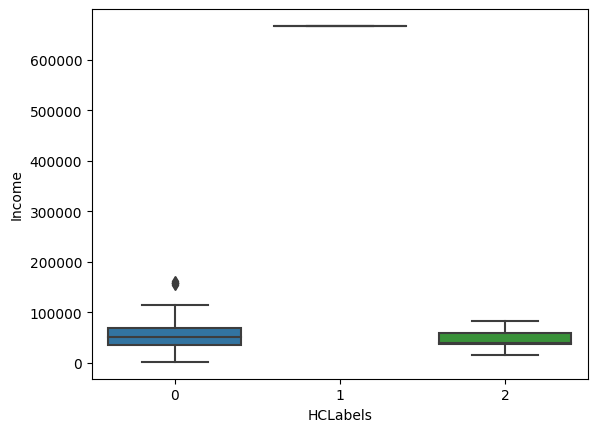

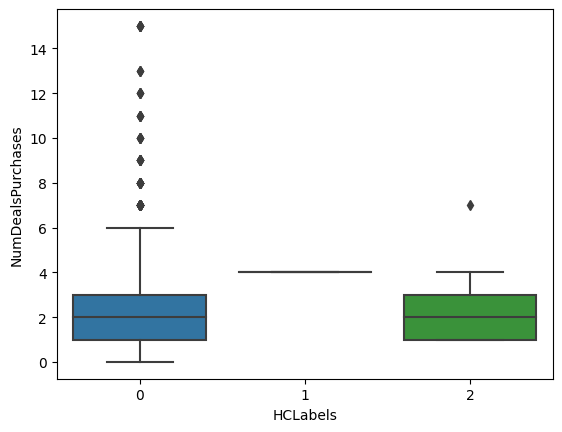

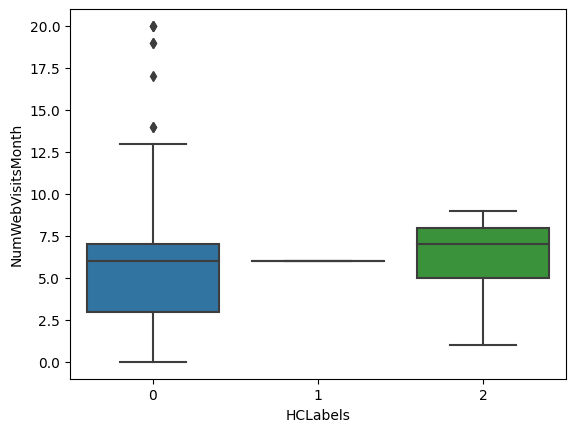

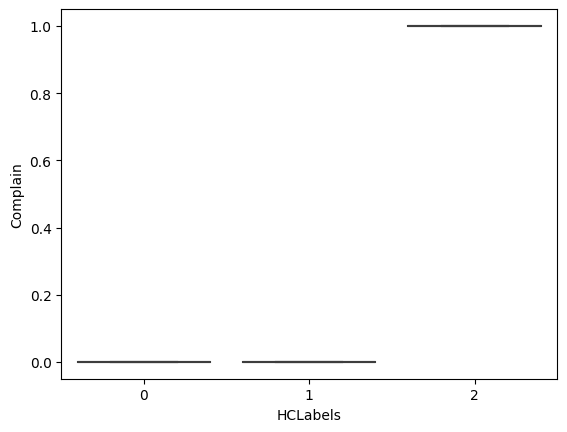

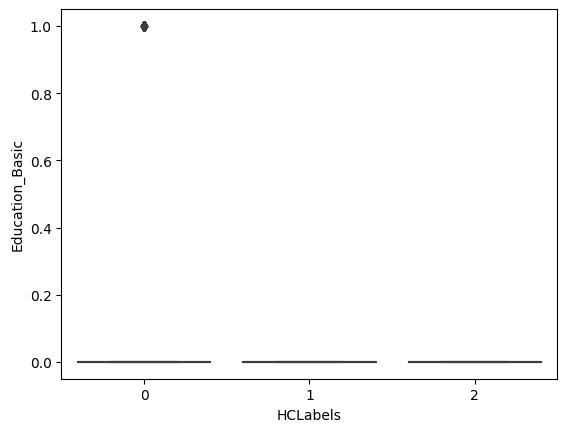

...

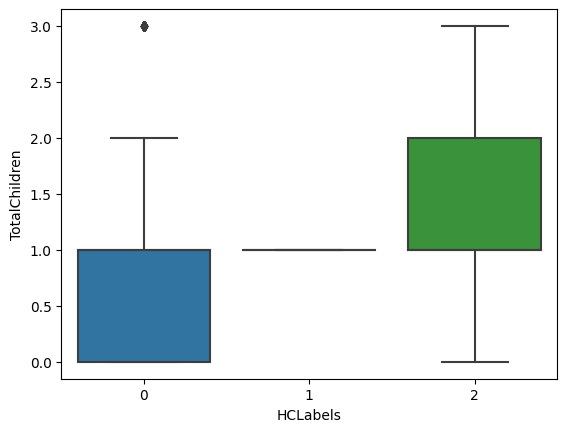

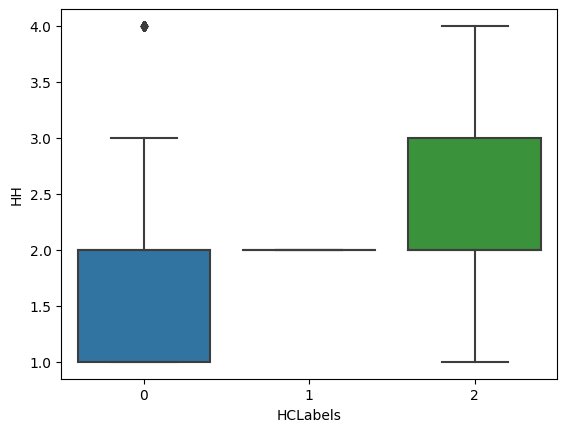

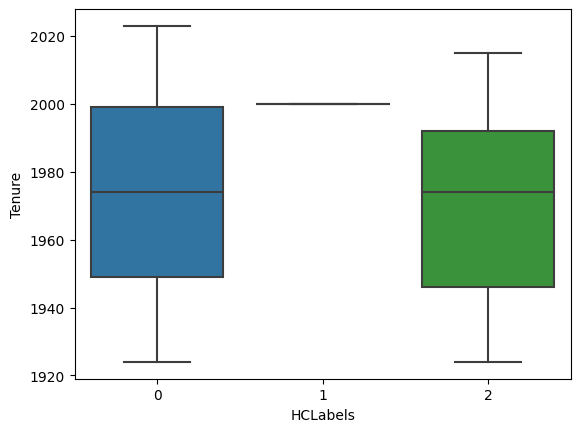

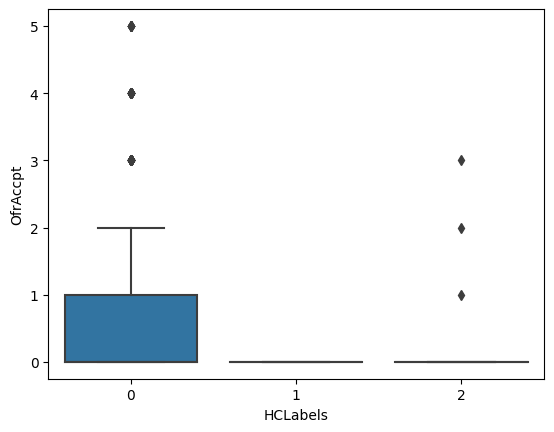

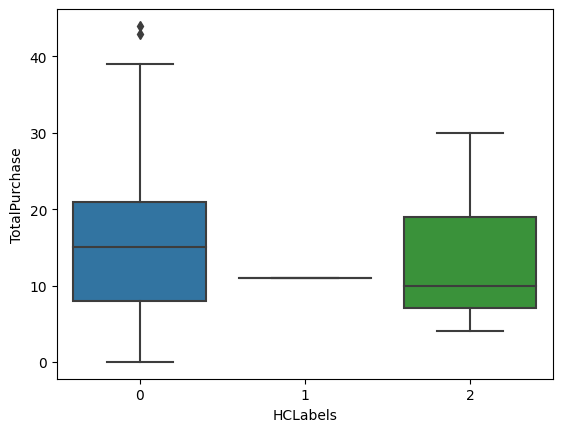

In [ ]:
cols_visualise = ['Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain', 'Education_Basic',
                  'Marital_Status_Widow', 'Age', 'TotalChildren', 'HH','Tenure','OfrAccpt','TotalPurchase']

for col in cols_visualise:
    sns.boxplot(x = 'HCLabels', y = col, data = data_copy)
    plt.show()


**Observations and Insights:**

### **Characteristics of each cluster**
- Most clusters overlap or are identical.


**Summary of each cluster:**

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

In [ ]:
dbs = DBSCAN(eps = 1)

data_scaled_copy['DBSLabels'] = dbs.fit_predict(data_scaled)

data_copy['DBSLabels'] = dbs.fit_predict(data_scaled)

In [ ]:
data_copy['DBSLabels'].value_counts()

 2     762
-1     754
 0     243
 1     196
 6      87
 5      24
 3      22
 4      22
 10     13
 14     12
 12     10
 8      10
 15      9
 7       8
 11      7
 13      7
 19      7
 18      6
 21      6
 9       5
 20      5
 22      5
 24      5
 16      5
 17      5
 23      5
Name: DBSLabels, dtype: int64

In [ ]:
# Calculating the mean and the median of the original data for each label
original_features = ['Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain', 'Education_Basic',
                  'Marital_Status_Widow', 'Age', 'TotalChildren', 'HH','Tenure','OfrAccpt','TotalPurchase']

mean = data_copy.groupby('DBSLabels').mean()

median = data_copy.groupby('DBSLabels').median()

df_hierachical = pd.concat([mean, median], axis = 0)

df_hierachical.index = [ 'group_-1 Mean', 'group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean','group_4 Mean', 'group_5 Mean','group_6 Mean','group_7 Mean','group_8 Mean','group_9 Mean','group_10 Mean', 'group_11 Mean', 'group_12 Mean', 'group_13 Mean','group_14 Mean', 'group_15 Mean', 'group_16 Mean', 'group_17 Mean', 'group_18 Mean','group_19 Mean', 'group_20 Mean','group_21 Mean','group_22 Mean','group_23 Mean','group_24 Mean','group_-1 Median', 'group_0 Median',
                        'group_1 Median', 'group_2 Median', 'group_3 Median','group_4 Median', 'group_5 Median','group_6 Median','group_7 Median','group_8 Median','group_9 Median','group_10 Median', 'group_11 Median', 'group_12 Median', 'group_13 Median',
                        'group_14 Median', 'group_15 Median', 'group_16 Median', 'group_17 Median', 'group_18 Median','group_19 Median', 'group_20 Median','group_21 Median','group_22 Median','group_23 Median','group_24 Median']

df_hierachical[original_features].T

,group_-1 Mean,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_5 Mean,group_6 Mean,group_7 Mean,group_8 Mean,...,group_15 Median,group_16 Median,group_17 Median,group_18 Median,group_19 Median,group_20 Median,group_21 Median,group_22 Median,group_23 Median,group_24 Median
Income,55910.397878,40414.226337,71995.484694,46615.608924,30488.954545,23598.500000,23347.833333,78803.666667,79126.250,56997.0,...,62061.0,82347.0,35860.0,37529.0,20194.0,55212.0,63810.0,55761.0,36957.0,33996.0
NumDealsPurchases,2.929708,2.781893,1.005102,2.182415,2.272727,1.090909,1.083333,0.965517,1.000,3.3,...,2.0,1.0,2.0,6.0,2.0,3.0,4.0,1.0,4.0,1.0
NumWebVisitsMonth,5.648541,6.316872,1.984694,5.673228,7.227273,6.318182,7.125000,2.436782,2.125,6.4,...,5.0,3.0,5.0,8.0,8.0,8.0,8.0,7.0,7.0,4.0
Complain,0.027851,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Education_Basic,0.046419,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Marital_Status_Widow,0.102122,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Age,56.665782,56.794239,53.816327,52.145669,49.454545,38.272727,50.125000,57.229885,40.250,65.7,...,49.0,74.0,50.0,38.0,41.0,62.0,52.0,59.0,70.0,36.0
TotalChildren,1.001326,2.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000,1.0,...,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0
HH,2.001326,3.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000,2.0,...,2.0,1.0,3.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0
Tenure,1976.551724,1969.979424,1967.341837,1972.763780,2007.181818,2004.409091,1942.916667,1966.275862,2014.125,1971.0,...,2006.0,2000.0,1986.0,1943.5,1954.0,1961.0,1967.5,1930.0,1971.0,1975.0


### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

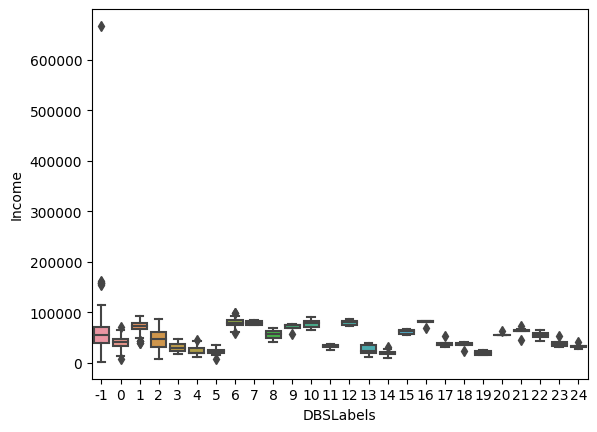

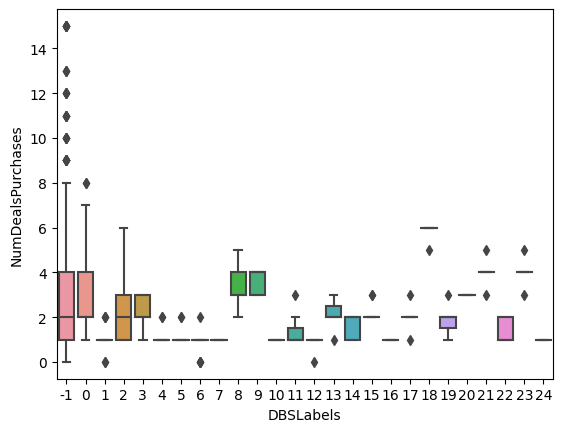

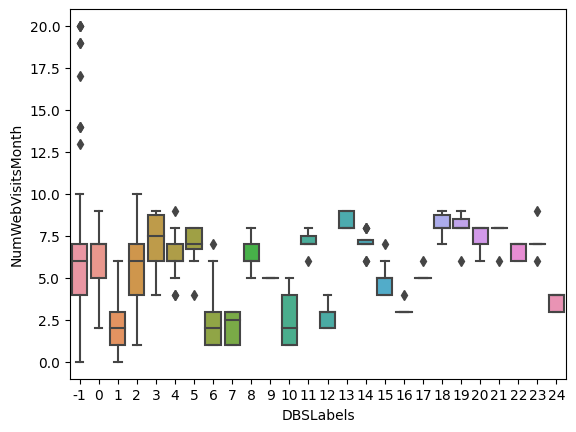

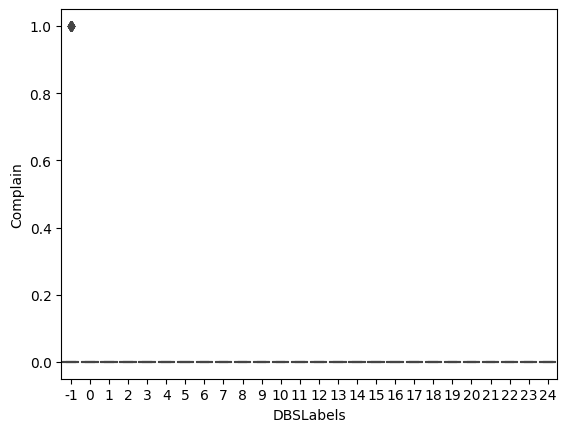

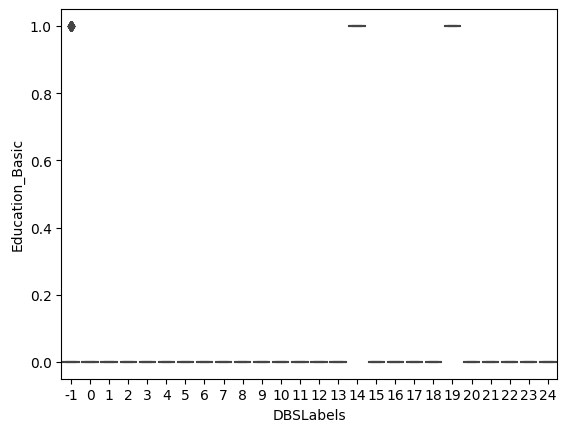

...

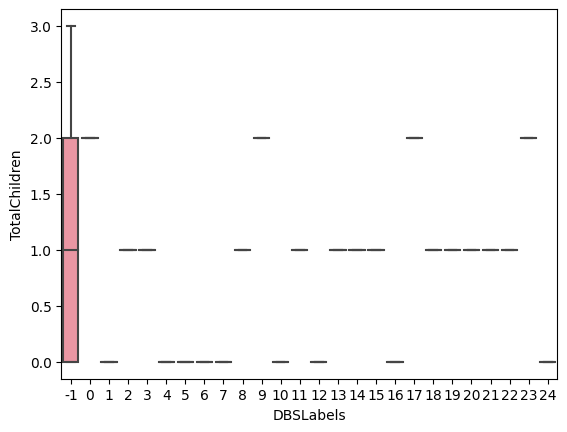

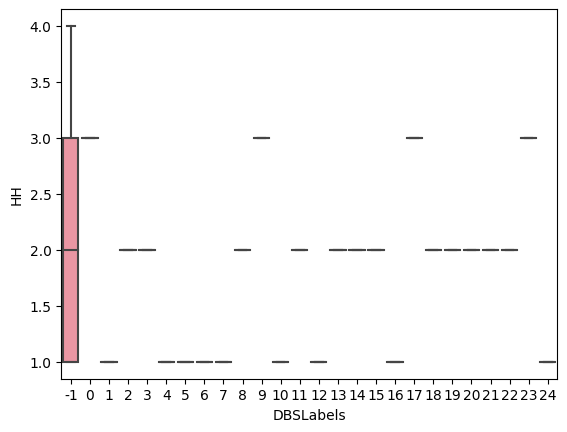

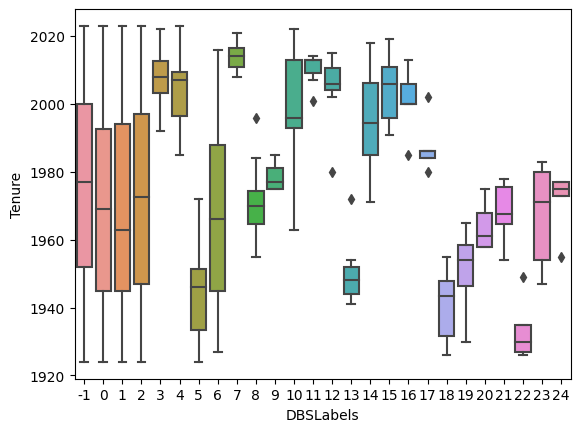

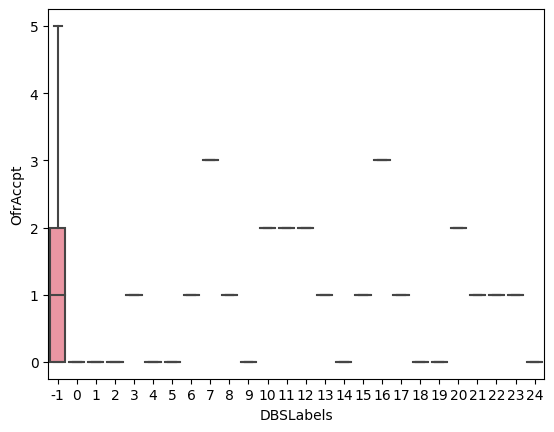

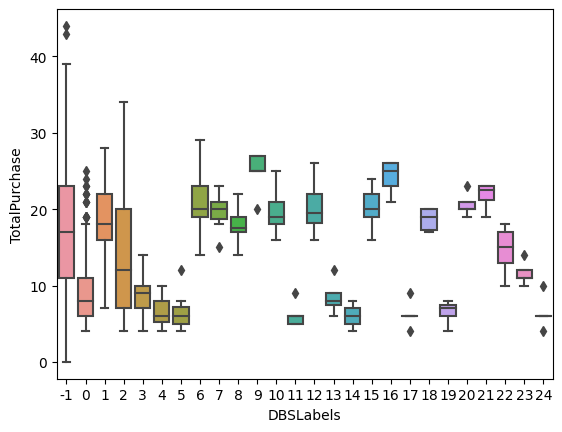

In [ ]:
for col in cols_visualise:
    sns.boxplot(x = 'DBSLabels', y = col, data = data_copy)

    plt.show()

**Observations and Insights:**

**Think about it:**

- Changing the eps and min sample values will result in different DBSCAN results? Can we try more value for eps and min_sample?

### **Characteristics of each cluster**

**Summary of each cluster:**

## **Gaussian Mixture Model**

In [ ]:
gmm = GaussianMixture(n_components = 6, random_state = 1)

gmm.fit(data_copy)

data_copy1['GmmLabels'] = gmm.predict(data_copy)

In [ ]:
data_copy1.GmmLabels.value_counts()

0    901
1    724
4    338
3    213
5     63
2      1
Name: GmmLabels, dtype: int64

In [ ]:
# Calculating the mean and the median of the original data for each label
mean = data_copy1.groupby('GmmLabels').mean()

median = data_copy1.groupby('GmmLabels').median()

df_gmm = pd.concat([mean, median], axis = 0)

df_gmm.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean','group_3 Mean', 'group_4 Mean', 'group_5 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median', 'group_5 Median']

df_gmm[original_features].T

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_5 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median,group_5 Median
Income,60333.004994,35579.137431,666666.0,75994.429577,55907.744083,18149.761905,63684.0,34845.5,666666.0,77044.0,55519.0,18746.0
NumDealsPurchases,2.163152,1.825967,4.0,1.262911,4.544379,2.031746,2.0,2.0,4.0,1.0,4.0,1.0
NumWebVisitsMonth,4.395117,6.325967,6.0,3.676056,6.127219,8.079365,4.0,7.0,6.0,3.0,6.0,7.0
Complain,0.000000,0.029006,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Education_Basic,0.000000,0.000000,0.0,0.000000,0.000000,0.857143,0.0,0.0,0.0,0.0,0.0,1.0
Marital_Status_Widow,0.000000,0.000000,0.0,0.000000,0.224852,0.015873,0.0,0.0,0.0,0.0,0.0,0.0
Age,55.100999,51.042818,46.0,54.586854,59.730769,46.539683,54.0,50.0,46.0,53.0,59.0,44.0
TotalChildren,0.702553,1.292818,1.0,0.154930,1.423077,0.714286,1.0,1.0,1.0,0.0,1.0,1.0
HH,1.702553,2.292818,2.0,1.154930,2.423077,1.714286,2.0,2.0,2.0,1.0,2.0,2.0
Tenure,1974.079911,1971.763812,2000.0,1977.112676,1975.488166,1975.746032,1973.0,1972.0,2000.0,1979.0,1975.0,1974.0


**Observations and Insights:**

### **Visualize the clusters using PCA**

### **Cluster Profiling**

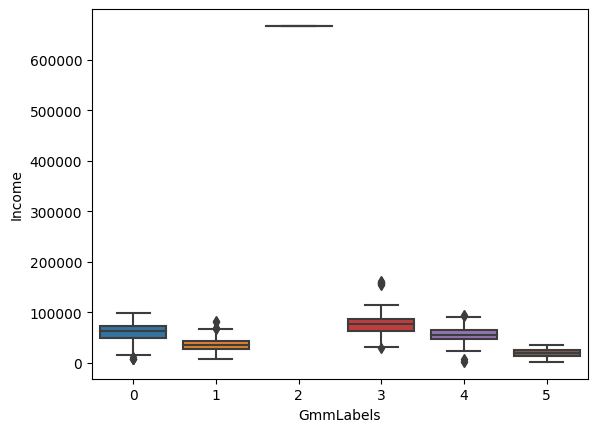

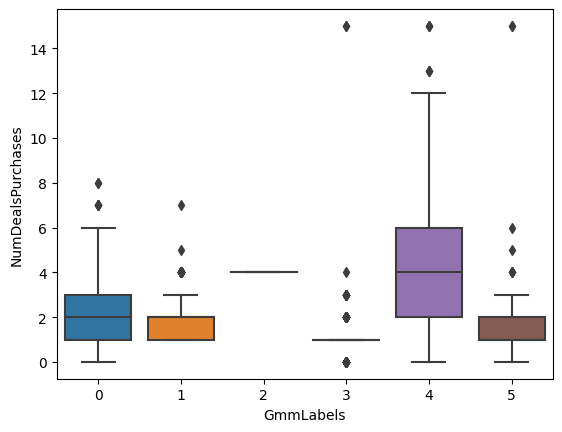

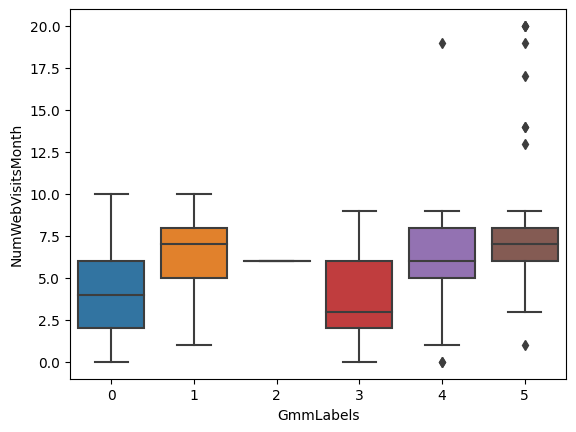

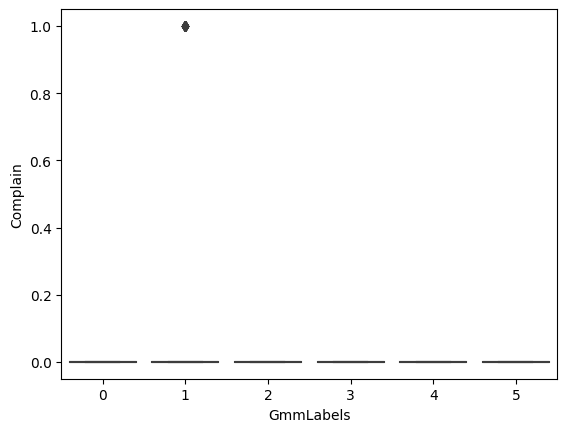

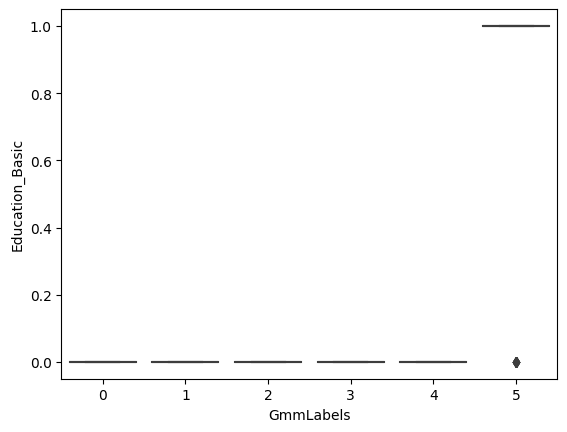

...

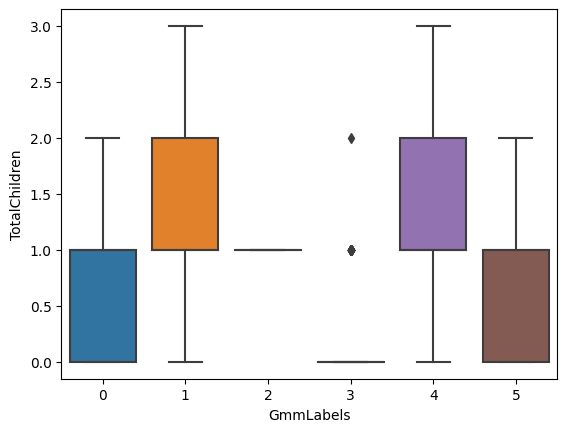

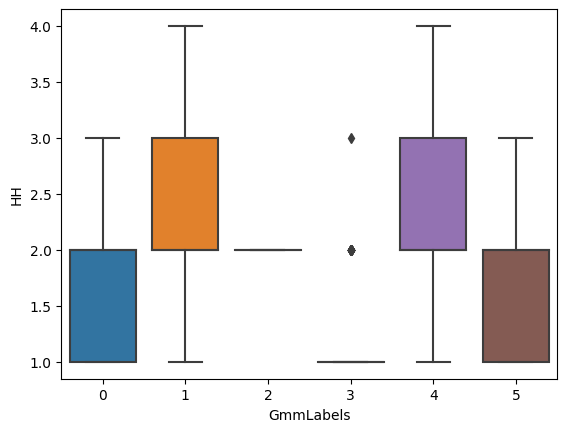

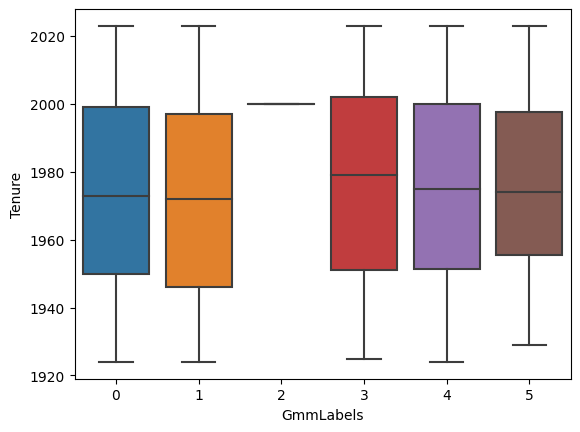

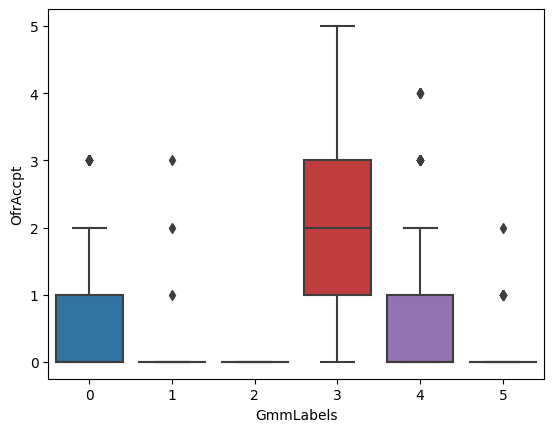

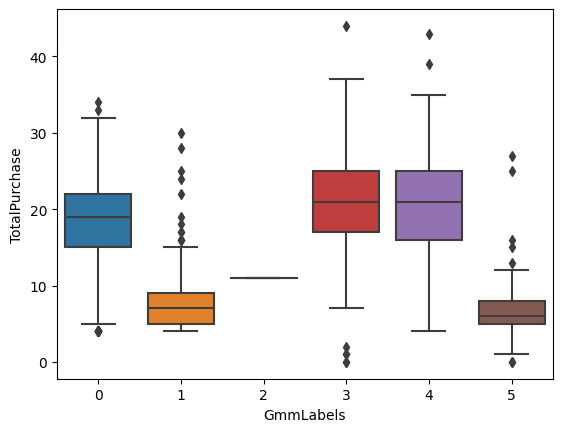

In [ ]:
for col in cols_visualise:
    sns.boxplot(x = 'GmmLabels', y = col, data = data_copy1)

    plt.show()

**Observations and Insights:**


### **Characteristics of each cluster**
- Similar to the other methods, no clear insight can be drawn from this segmentation
- The visuals show that cluster 2, 5 and 6 represent customers with the lowest total purchases while 1 and 4 represent customers with the highest total purchasing history.
- The clusters overlap greatly when plotted against tenure showing that there is no difference between customers in different clusters when it comes to how long they've engaged with the company.

**Summary of each cluster:**

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- Unfortunately, looking at the visualization for each cluster across the different methodologies shows that most of the methods were able to segment the data into clear clusters that could be useful for the company.
- comparatively, K-medoids clustering method produced the clearest segmentation when plotted against income and distributed customers more evely among groups.Therefore, this method is recommended for segmenting the data

**2. Refined insights**:
- Looking at the K-medoids groups, it can be observed that although overlap between groups exist, income is the distinctive feature separating each group.

**3. Proposal for the final solution design:**
- By using the k-medoids clustering method, stakeholders could benefit from tailoring their marketing to fit the customer base with-in the specified income range of each group.
- Further examining how each group behaves will be cruical in establishing impactful strategies.
- However, reexamining this data and looking into additional preprocessing and data preparation methods could yeild groups that are more clearly divided.

**Recommendations for Implementation**

Provided that customers are grouped by income, stakeholders should invest in strategizing and developing tailored marketing campaigns for each group. For example, by studying the spending history of each group or by observing where these purchases were made- online vs in-store- the company could offer deals or release campaigns featuring specific goods that customers within these groups could be interested in. However, continuing to better this analysis by trying segmentation using different variables, or performing additional data pre-processing could yeild groups with clearer boarders ensuring that each group is distinctive and unlikely to behave similarly to another.